# SPATIAL ANALYSIS OF ISS DATASETS

This tutorial is an example of how to use Squidpy to analyze In Situ Sequencing datasets, performing several different statistical tests to understand the spatial organization of tissues. This tutorial follows the scanpy tutorial/pciseq tutorials, so we'll take as an input an h5 object created. More information, if needed, can be found at: https://squidpy.readthedocs.io/en/stable/tutorials.html

# Loading the needed packages

The first step is to load the needed packages. If any of them fails, please go and check that they are installed in the appropiate environment

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import squidpy as sq
import scanpy as sc
import os

/opt/anaconda3/envs/sccellfie/lib/python3.10/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/opt/anaconda3/envs/sccellfie/lib/python3.10/site-packages/anndata/utils.py:434: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


# Load your dataset

We are going to load our dataset, were we have alredy performed clustering, from an h5ad file. If you want to check how to format your data in this format, please check the Scanpy tutorial

In [2]:
adatall=sc.read('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_adata4_301023_with_colors.h5ad')

/home/sergioms/miniconda3/envs/spatial2022/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


# Contiune with other analysis

In [3]:
adatall.obs['celltype_annotated_general']=adatall.obs['celltype_annotated_general'].astype(str)

In [4]:
###commented on 21st of 11 2023
#adatall.obs.loc[adatall.obs['celltype_annotated_refined']=='Epithelial LYZ','celltype_annotated_general']='SMG intermediate'
#adatall.obs.loc[adatall.obs['celltype_annotated_refined']=='Epithelial LYZ','cell_class']='SMG'

In [5]:
excluded_cols=['reference', 'old_annotation','annotation_3', 'annotation_2', 'annotation_1', 'leiden','previous_annotation', 'celltype_annotated', 'celltype_annotated_epi']
adatall.obs=adatall.obs.loc[:,~adatall.obs.columns.isin(excluded_cols)]

In [6]:
#adatall.obs.loc[adatall.obs['celltype_annotated_general']=='nan','celltype_annotated_refined'].unique()
#adatall.obs.loc[:,'celltype_annotated_general']=adatall.obs.loc[:,'celltype_annotated_general'].astype(str)
#adatall.obs.loc[adatall.obs.loc[:,'celltype_annotated_refined']=='Mast cells','celltype_annotated_general']='Mast cells'
#adatall.obs.loc[adatall.obs.loc[:,'celltype_annotated_refined']=='Fibro alveolar MGP-','celltype_annotated_general']='Fibroblast alveoli'
#adatall.obs.loc[adatall.obs.loc[:,'celltype_annotated_refined']=='Fibro alveolar MGP+','celltype_annotated_general']='Fibroblast alveoli'
#adatall.obs.loc[adatall.obs.loc[:,'celltype_annotated_refined']=='AT2','celltype_annotated_general']='AT2'
#adatall.obs.loc[adatall.obs.loc[:,'celltype_annotated_refined']=='AT1','celltype_annotated_general']='AT1'
#adatall.obs.loc[adatall.obs.loc[:,'celltype_annotated_refined']=='Fibro. adventitial','celltype_annotated_general']='Fibroblast general'
#adatall.obs.loc[adatall.obs.loc[:,'celltype_annotated_general']=='Fibroblasts General','celltype_annotated_general']='Fibroblast general'
#['Mast cells'
# , 'Fibro alveolar MGP-', 'AT2', 'B plasma', 'AT1', 'Fibro. adventitial', 'Fibro alveolar MGP+', '?']

In [7]:
'''
dic={'Mast cells':'Immune','Fibro alveolar':'Stromal','AT2':'Alveolar epithelial','AT1':'Alveolar epithelial','B plasma':'Immune','Fibro. adventitial':'Stromal',
    'Doublets':'Doublets', 'Ciliated':'Bronchial epithelial', 'Nan':'Nan', 'Suprabasal':'Bronchial epithelial', 'Monocytes':'Immune',
       'Epithelial unknown':'Bronchial epithelial', 'Capillary':'Endothelial', 'nan':'Nan', 'Deuterosomal':'Bronchial epithelial', 'Mucous':'SMG',
       'Serous':'SMG', 'Secretory':'Bronchial epithelial', 'Smooth muscle':'Stromal', 'Mesenchyme':'Stromal', 'Venous':'Endothelial',
       'Pericytes':'Stromal', 'Arterial':'Endothelial', 'Fibroblasts':'Stromal', 'Neuroendocrine':'Bronchial epithelial',
       'Lymphatic endothelium':'Endothelial', 'Basal':'Bronchial epithelial', 'Macrophages':'Immune', 'T cell':'Immune',
       'B lymphocytes':'Immune', 'DC':'Immune','Fibroblast general':'Stromal','Fibroblast alveoli':'Stromal',
     'Myoepithelial':'SMG',
 'Goblet':'Bronchial epithelial', 'Serous_Duct':'SMG', 'Fibroblast General':'Stromal','Fibroblast Adventitial':'Stromal',
     'Nan_Doublets':'Nan_Doublets',
 'Mesenchyme other':'Stromal',
 'Squamous':'Bronchial epithelial',
 'Epithelial other':'Bronchial epithelial',
 'Fibroblasts other':'Stromal',
 'NK cells':'Immune',
 'Ionocytes':'Bronchial epithelial',
 'Rare':'Bronchial epithelial',
 'Tuft':'Bronchial epithelial','SMG intermediate':'SMG'
}
adatall.obs['cell_class']=adatall.obs['celltype_annotated_general'].map(dic)
adatall=adatall[adatall.obs['celltype_annotated_general']!='nan']
adatall=adatall[adatall.obs['celltype_annotated_general']!='Doublets']
adatall=adatall[adatall.obs['celltype_annotated_general']!='Nan']
'''

"\ndic={'Mast cells':'Immune','Fibro alveolar':'Stromal','AT2':'Alveolar epithelial','AT1':'Alveolar epithelial','B plasma':'Immune','Fibro. adventitial':'Stromal',\n    'Doublets':'Doublets', 'Ciliated':'Bronchial epithelial', 'Nan':'Nan', 'Suprabasal':'Bronchial epithelial', 'Monocytes':'Immune',\n       'Epithelial unknown':'Bronchial epithelial', 'Capillary':'Endothelial', 'nan':'Nan', 'Deuterosomal':'Bronchial epithelial', 'Mucous':'SMG',\n       'Serous':'SMG', 'Secretory':'Bronchial epithelial', 'Smooth muscle':'Stromal', 'Mesenchyme':'Stromal', 'Venous':'Endothelial',\n       'Pericytes':'Stromal', 'Arterial':'Endothelial', 'Fibroblasts':'Stromal', 'Neuroendocrine':'Bronchial epithelial',\n       'Lymphatic endothelium':'Endothelial', 'Basal':'Bronchial epithelial', 'Macrophages':'Immune', 'T cell':'Immune',\n       'B lymphocytes':'Immune', 'DC':'Immune','Fibroblast general':'Stromal','Fibroblast alveoli':'Stromal',\n     'Myoepithelial':'SMG',\n 'Goblet':'Bronchial epithelial

# continue from here

In [8]:
#adatall=sc.read('/mnt/d/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_adata4_180123_allcts.h5ad')

In [9]:
adata=adatall#sc.AnnData(adatall.raw.X,obs=adatall.obs,var=adatall.raw.var)
adatall.obs['X']=adatall.obs['x']
adatall.obs['Y']=adatall.obs['y']

In [10]:
for a in adatall.obs['sample'].unique():
    ads=adatall[adatall.obs['sample']==a]
#    sc.pl.umap(ads,color=['annotation_2'],cmap='hsv',s=30)#,'total_counts'])#,save='chickbrain_UMAP_bins.pdf')
#    map_of_clusters(ads,key='celltype_annotated_refined',figuresize=(8,8),size=5)
    ads.obs['UMAP_1']=ads.obsm['X_umap'][:,0]
    ads.obs['UMAP_2']=ads.obsm['X_umap'][:,1]
    ads.obs.to_csv('/mnt/f/ISS/baysor_annotated_clusters_301023/'+a+'_clusters.csv')

/tmp/ipykernel_87/3965700090.py:5: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ads.obs['UMAP_1']=ads.obsm['X_umap'][:,0]
/tmp/ipykernel_87/3965700090.py:5: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ads.obs['UMAP_1']=ads.obsm['X_umap'][:,0]
/tmp/ipykernel_87/3965700090.py:5: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ads.obs['UMAP_1']=ads.obsm['X_umap'][:,0]
/tmp/ipykernel_87/3965700090.py:5: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ads.obs['UMAP_1']=ads.obsm['X_umap'][:,0]
/tmp/ipykernel_87/3965700090.py:5: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ads.obs['UMAP_1']=ads.obsm['X_umap'][:,0]
/tmp/ipykernel_87/3965700090.py:5: ImplicitModificationWarning: Trying to modify attribute `.obs` of

In [11]:
dicreg={'LNG1':'Distal Lung','LNG2':'Trachea','LNG3':'Proximal Lung','LNG5':'Distal Lung','LNG6':'Distal Lung'}
adatall.obs['position']=adatall.obs['region'].map(dicreg)

In [6]:
dic=pd.read_csv('/mnt/f/ISS/annotations_dicts/colors_celltype_annotated_general.csv',sep=';')
dictio=dict(zip(dic['celltype_annotated_general'],dic['colors']))
dictio['SMG intermediate']='blue'

In [13]:
adatall.obs['cell_class']=adatall.obs['level1']

In [14]:
#adatall.uns['celltype_annotated_refined_colors']=colors

In [17]:
colors=['#C1D960','#1CB062','#EB4764','#F2CE6C','#AFAFAF','#637FBF','#63BBDC']
adatall.uns['cell_class_colors']=colors

In [18]:
adatall.write('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_112123_allcts_colors.h5ad')

In [2]:
adatall=sc.read('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_112123_allcts_colors.h5ad')

/home/sergioms/miniconda3/envs/spatial2022/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [ ]:
sc.settings.set_figure_params(transparent=True)
sc.set_figure_params(figsize=(10,10),dpi=300)
sc.settings.set_figure_params(transparent=True)
sc.set_figure_params(figsize=(9,8),dpi=300)
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sc.pl.umap(adatall,color='cell_class',size=10,legend_fontsize=5,legend_fontoutline=0.8,legend_fontweight='semibold',add_outline=False,save='_annotated_clusters_cell_class_nooutline_size10.pdf')#,save='annotated_clusters_celltype_annotated_refined.pdf')

In [9]:
col=pd.read_csv('/mnt/f/ISS/annotations_dicts/colors_celltype_annotated_general.csv',sep=';')
coldict=dict(zip(col['celltype_annotated_general'].astype(str),col['colors']))
coldict['SMG intermediate']='blue'
adatall.uns['celltype_annotated_general_colors']=[coldict[e] for e in  np.unique(adatall.obs['celltype_annotated_general'])]

In [ ]:
sc.settings.set_figure_params(transparent=True)
sc.set_figure_params(figsize=(9,8),dpi=300)
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

sc.pl.umap(adatall,color='celltype_annotated_general',size=12,add_outline=False,legend_fontsize=5,legend_fontoutline=0.8,legend_fontweight='semibold',save='annotated_clusters_celltype_annotated_general_nooutline_size12.pdf')#,save='annotated_clusters_celltype_annotated_refined.pdf')

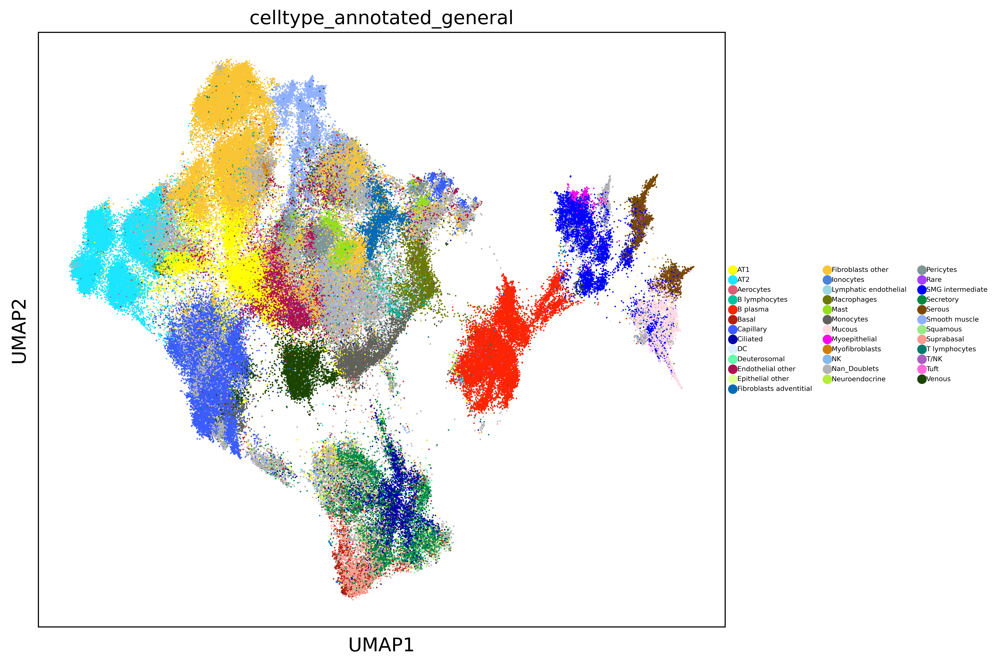

In [12]:
sc.settings.set_figure_params(transparent=True)
sc.set_figure_params(figsize=(9,8),dpi=300)
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

sc.pl.umap(adatall,color='celltype_annotated_general',size=5,add_outline=False,legend_fontsize=5,legend_fontoutline=0.8,legend_fontweight='semibold',save='annotated_clusters_celltype_annotated_general_nooutline_size5.pdf')#,save='annotated_clusters_celltype_annotated_refined.pdf')

In [ ]:
sc.settings.set_figure_params(transparent=True)
sc.set_figure_params(figsize=(9,8),dpi=600,dpi_save=600)
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
adatall.uns['position_colors']=['#c21597','#35bee8','#e67607']
sc.pl.umap(adatall,color='position',size=12,add_outline=False,legend_fontsize=5,legend_fontoutline=0.01,legend_fontweight='semibold',save='_position_bold_nooutline_size12.pdf')#,save='annotated_clusters_celltype_annotated_refined.pdf')

### Plot only rare celltypes in umap 

In [14]:
adata_rare=adatall[adatall.obs['celltype_annotated_collapsed']=='Other cell types',:]

In [ ]:
sc.settings.set_figure_params(transparent=True)
sc.set_figure_params(figsize=(9,8),dpi=500,dpi_save=500)
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
ax=sc.pl.umap(adatall,size=2,add_outline=False,show=False,na_color='#e8e8e8')#,save='annotated_clusters_celltype_annotated_refined.pdf')
sc.pl.umap(adata_rare,color='celltype_annotated_general',size=10,add_outline=False,legend_fontsize=5,legend_fontoutline=0.8,legend_fontweight='semibold',ax=ax,show=False)#,save='annotated_clusters_celltype_annotated_refined.pdf')
plt.savefig('/mnt/f/ISS/plots_for_publication/UMAP_rare_celltypes_nooutline_size10.pdf')

# Gene expression on tissue

In [25]:
col=pd.read_excel('/mnt/f/ISS/annotations_dicts/Dictionary-for-gene-heatmap.xlsx',sheet_name=0)
renamedict=dict(zip(col['Celltype_annotated_general'],col['Celltype_annotated_general_heatmap']))

In [26]:
adatall.obs['celltype_annotated_general_dotplot']=adatall.obs['celltype_annotated_general'].map(renamedict)
adatall.obs['celltype_annotated_general_dotplot']=adatall.obs['celltype_annotated_general_dotplot'].astype(str)

In [27]:
markers=['AGER','S100A4','SFTPA1','SFTPB','CLDN5','EDNRB','HPGD','FCN3','CCL21','IGFBP7','RAMP2','ACKR1','PLVAP','SLPI','KRT5','KRT15','CAPS','CD24','CDC20B','ASCL3','SEC11C','GRP','PCSK1N','HES6','NREP','AGR2','WFDC2','SCGB1A1','MUC5AC','SPRR1B','SPRR3','S100A2','SERPINB3','RGS13','MGP','PLA2G2A','FN1','FBLN1','RGCC','CFD','DCN','APOE','CD52','CD79A','CD74','JCHAIN','FKBP11','CST3','HLA-DQA1','HLA-DPB1','HLA-DRA','C1QC','HDC','S100A8','FCN1','NKG7','GNLY','GZMB','CD3E','CD3D','CD8A','LYZ','BPIFB1','PRR4','ALDH1A3','MUC5B','MYL9','MYH11','ACTA2']

In [28]:
adataexp=adatall.to_df()
adataexp['exp']=adatall.obs['celltype_annotated_refined']

In [29]:
meanexp=adataexp.groupby('exp').mean()

In [30]:
confusion_level23=pd.crosstab(adatall.obs['celltype_annotated_general'],adatall.obs['celltype_annotated_refined'])
confusion_level23.to_csv('/mnt/c/Users/sergio.salas/Documents/confusion_level2_level3.csv')

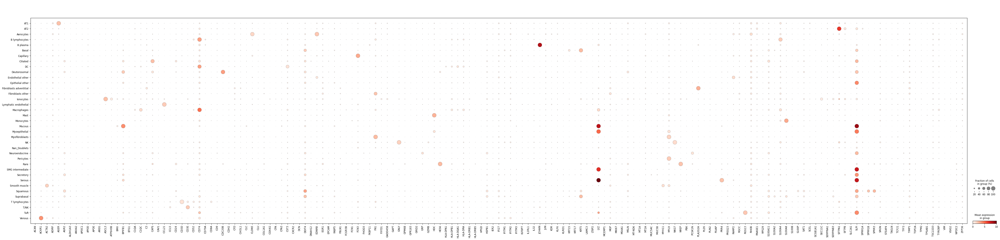

In [31]:
sc.pl.dotplot(adatall,adatall.var.index,groupby='celltype_annotated_general')

In [ ]:
import seaborn as sns
sns.clustermap(meanexp,figsize=(40,30),cmap='Blues',linewidths=0.5,linecolor='grey')
#plt.savefig('/')

In [35]:
adatall.obs.loc[adatall.obs['celltype_annotated_general_dotplot']=='nan','celltype_annotated_general'].astype(str).unique()

array([], dtype=object)

# Represent heatmaps

In [ ]:
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sc.pl.matrixplot(adatall,markers,groupby='celltype_annotated_general',standard_scale='var',show=False)

In [ ]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sc.pl.matrixplot(adatall,markers,groupby='celltype_annotated_general_dotplot',standard_scale='var',show=False)
plt.savefig('/mnt/f/ISS/plots_for_publication/deg/matrixplot_lung_genes_celltype_annotated_general.pdf')

In [ ]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sc.pl.dotplot(adatall,markers,groupby='celltype_annotated_general_dotplot',dot_max=0.5,show=False)
plt.savefig('/mnt/f/ISS/plots_for_publication/deg/dotplot_lung_genes_celltype_annotated_general.pdf')

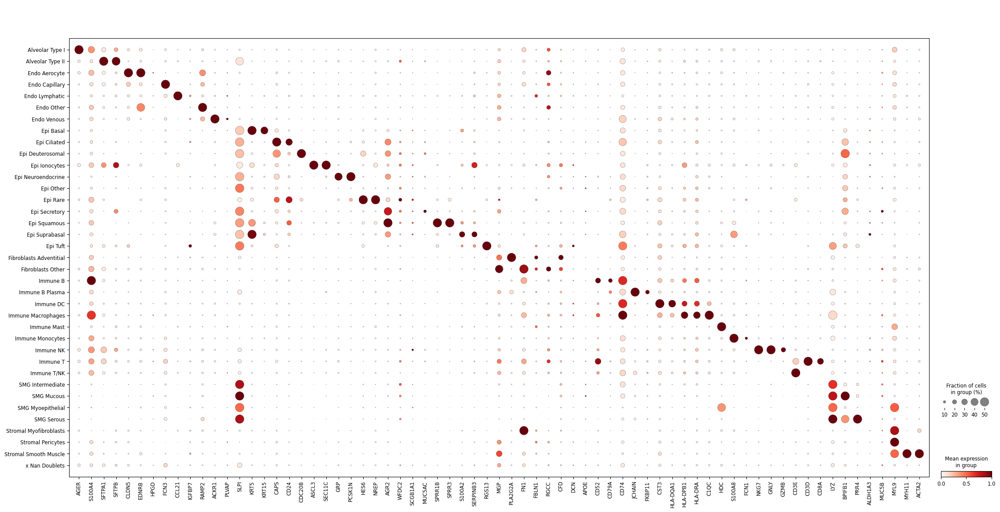

In [39]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sc.pl.dotplot(adatall,markers,groupby='celltype_annotated_general_dotplot',dot_max=0.5,standard_scale='var',show=False)
plt.savefig('/mnt/f/ISS/plots_for_publication/deg/dotplot_lung_genes_celltype_annotated_general_normalized.pdf')

In [ ]:
sc.settings.set_figure_params(transparent=True)
sc.set_figure_params(figsize=(9,8),dpi=300)
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sc.pp.log1p(adatall)
sc.tl.rank_genes_groups(adatall, 'celltype_annotated_general', method='t-test', key_added = "t-test")
#sc.pl.rank_genes_groups_dotplot(adatall, n_genes=1, key = "t-test",save='markers_1gene')
sc.pl.rank_genes_groups_dotplot(adatall, n_genes=1, key = "t-test",save='markers_1gene')#,show=False)
plt.savefig('/mnt/f/ISS/plots_for_publication/deg/dotplot_1gene.pdf')
sc.settings.set_figure_params(transparent=True)
sc.set_figure_params(figsize=(9,8),dpi=300)
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sc.pp.log1p(adatall)
sc.tl.rank_genes_groups(adatall, 'celltype_annotated_general', method='t-test', key_added = "t-test")
#sc.pl.rank_genes_groups_dotplot(adatall, n_genes=1, key = "t-test",save='markers_1gene')
sc.pl.rank_genes_groups_dotplot(adatall, n_genes=2, key = "t-test",save='markers_2gene')#,show=False)
plt.savefig('/mnt/f/ISS/plots_for_publication/deg/dotplot_2gene.pdf')

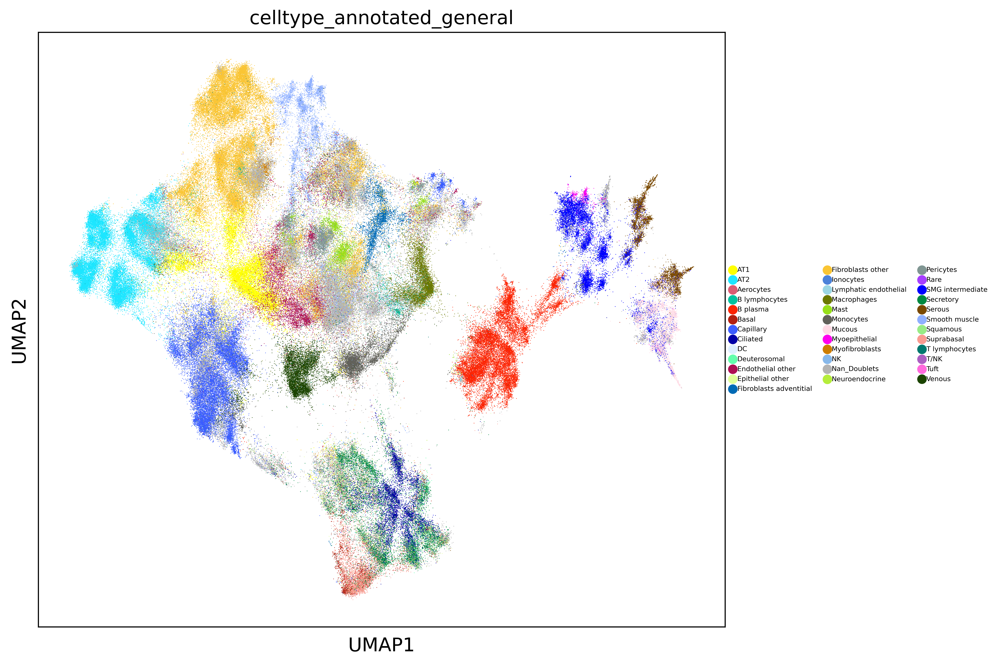

In [41]:
sc.settings.set_figure_params(transparent=True)
sc.set_figure_params(figsize=(9,8),dpi=300)
sc.pl.umap(adatall,color='celltype_annotated_general',size=1,legend_fontsize=5,legend_fontoutline=0.8,legend_fontweight='semibold',save='annotated_clusters_celltype_annotated_general_nooutline.pdf')

In [42]:
sb=adatall[adatall.obs['celltype_annotated_general']=='Smooth muscle']

In [ ]:
sc.settings.set_figure_params(transparent=True)
sc.set_figure_params(figsize=(9,8),dpi=300)
sc.pl.umap(adatall,color='celltype_annotated_collapsed',size=1,legend_fontsize=5,legend_fontoutline=0.8,legend_fontweight='semibold',save='annotated_clusters_celltype_annotated_collapsed_nooutline.pdf')

In [44]:
def map_of_clusters(adata,key='leiden',clusters='all',size=8,background='white',figuresize=(10,7),save=None,format='pdf'):
    
    #PARAMETERS TO MODIFY:
    #-key: the terms in adata.obs that you want to plot
    #-clusters:'all' for plotting all clusters in a single plot, 'individual': for plots of individual genes, or ['3','5'] (your groups
    #          between square brackets to plot only some clusters
    #-size: to change the size of your spots
    #-background: to change the color of the background
    #-figuresize: to specify the size of your figure
    #-save: if you want to save your figure, give the PATH of the folder where you want to save it
    #-format: specify the format in which you want to save your figure
    
#    try:
#        adata.obs[key]=adata.obs[key].astype(int)
#        colors=dict(zip(np.unique(adata.obs[key]),adata.uns[key+'_colors']))
#    except:
    colors=dict(zip(np.unique(adata.obs[key]),adata.uns[key+'_colors']))
    #cl.apply(lambda x: colors[x])
    plt.rcParams['figure.facecolor'] = background
    if clusters=='all':
        cl=adata.obs[key]
#        plt.figure(figsize=figuresize)
        figa=plt.scatter(x=adata.obs.X,y=adata.obs.Y,c=cl.apply(lambda x: colors[x]),s=size,linewidths=0, edgecolors=None)
        plt.axis('off')
        if not save==None:
            plt.savefig(save +'map_all_clusters_'+str(size)+'_'+background+'_'+key+'.'+format)
    elif clusters=='individual':
        cl=adata.obs[key]
        for each in adata.obs[key].unique():
            adatasub=adata[adata.obs[key]==each]
            plt.figure(figsize=figuresize)
            plt.scatter(x=adata.obs.X,y=adata.obs.Y,c='grey',s=size/5,linewidths=0, edgecolors=None)
            cl=adatasub.obs[key]
            plt.scatter(x=adatasub.obs.X,y=adatasub.obs.Y,c=cl.apply(lambda x: colors[x]),s=size,linewidths=0, edgecolors=None)
            plt.axis('off')
            plt.title('Group: '+ str(each))
            if not save==None:
                plt.savefig(save +'map_inidivdual_cluster_'+str(each)+'_'+str(size)+background+'_'+key+'.'+format)
    else:
        adatasub=adata[adata.obs[key].isin(clusters)]
        plt.figure(figsize=figuresize)
        plt.scatter(x=adata.obs.X,y=adata.obs.Y,c='grey',s=size/5,linewidths=0, edgecolors=None)
        cl=adatasub.obs[key]
        plt.scatter(x=adatasub.obs.X,y=adatasub.obs.Y,c=cl.apply(lambda x: colors[x]),s=size,linewidths=0, edgecolors=None)
        plt.axis('off')
        plt.legend()
        if not save==None:
                s=''
                for element in clusters:
                    s=s+str(element)
                print(s)
                plt.savefig(save +'map_group_of_clusters_'+str(s)+'_'+str(size)+background+'_'+key+'.'+format)
#        plt.title('Group: '+ paste(clusters))

# Justifying the combination of LNG1,LNG5,LNG6

In [4]:
adata=adatall

In [7]:
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=100, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
region_by_celltype=pd.crosstab(adata.obs['region'],adata.obs['celltype_annotated_collapsed'])
region_by_celltype=region_by_celltype.loc[:,~region_by_celltype.columns.isin(['Nan_Doublets'])]
region_by_celltype.sum(axis=1)
region_by_celltype=region_by_celltype.div(region_by_celltype.sum(axis=1),axis=0)
region_by_celltype=region_by_celltype.div(region_by_celltype.sum(axis=0),axis=1)
region_by_celltype.to_csv('/Users/sergio/Downloads/celltype_frequency_iss_by_sampling_region_1c.csv')

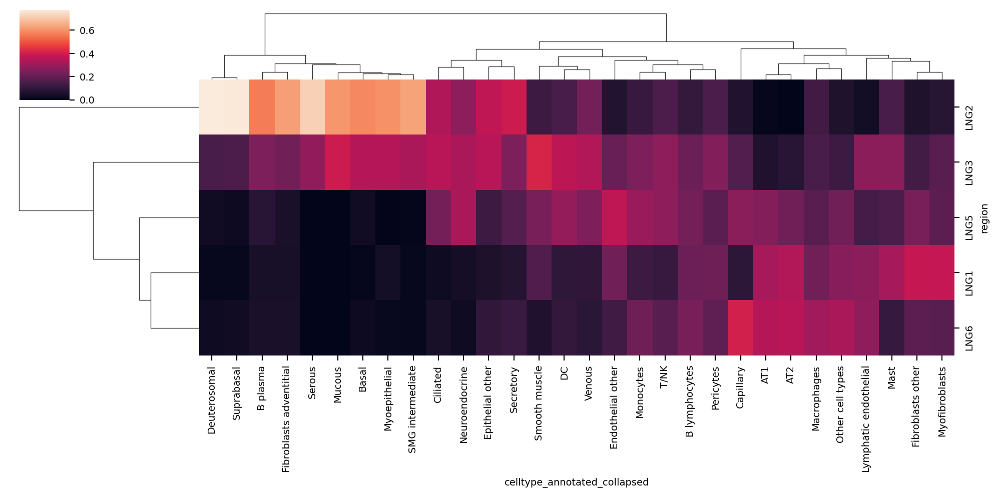

In [45]:
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=100, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
region_by_celltype=pd.crosstab(adata.obs['region'],adata.obs['celltype_annotated_collapsed'])
region_by_celltype=region_by_celltype.loc[:,~region_by_celltype.columns.isin(['Nan_Doublets'])]
region_by_celltype.sum(axis=1)
region_by_celltype=region_by_celltype.div(region_by_celltype.sum(axis=1),axis=0)
region_by_celltype=region_by_celltype.div(region_by_celltype.sum(axis=0),axis=1)
import seaborn as sns
sns.clustermap(region_by_celltype,figsize=(10,5))
plt.savefig('/mnt/f/ISS/plots_for_publication/clustergram_region_by_celltype_freqs_lng156_just.pdf')

# explore frequencies

In [ ]:
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=100, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
freqs=pd.crosstab(adatall.obs['position'],adatall.obs['cell_class'])
##freqs=freqs.iloc[[0,3,5,8,4,6,9,2,1,7,10],:]
fig=plt.figure()
freqsnorm=freqs.div(freqs.sum(axis=1),axis=0)
freqsnorm=freqsnorm.loc[['Trachea','Proximal Lung','Distal Lung'],:]
freqsnorm.plot(kind='area',stacked=True,figsize=(8,10),color=adatall.uns['cell_class_colors'])
plt.grid(False)
plt.savefig('/mnt/f/ISS/plots_for_publication/areaplot_relative_frequency_ISS_cell_class.pdf')

In [47]:
freqsnorm2=freqsnorm.transpose()

In [48]:
freqsnorm2=freqsnorm2.div(np.sum(freqsnorm2,axis=1),axis=0)

In [ ]:
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=100, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
import seaborn as sns
sns.clustermap(freqsnorm2,figsize=(6,6))
plt.savefig('/mnt/f/ISS/plots_for_publication/heatmap_relative_frequency_ISS_cell_class.pdf')

In [ ]:
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=100, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sc.set_figure_params(figsize=(3,3),dpi=100)
freqsnorm.plot(kind='area',stacked=True,figsize=(7,7),color=adatall.uns['cell_class_colors'],grid=False)
plt.savefig('/mnt/f/ISS/plots_for_publication/areaplot_relative_frequency_ISS_cell_class.pdf')

In [ ]:
sc.settings.set_figure_params(transparent=True)
sc.set_figure_params(figsize=(3,3),dpi=100)
for cl in freqsnorm.columns:
    plt.figure(figsize=(5,3))
    freqsnorm.loc[:,cl].plot(kind='line',stacked=True,figsize=(5,3),grid=False)
    plt.title(cl)
    plt.ylim(0,0.5)

# Frequencies on level2

<Figure size 400x400 with 0 Axes>

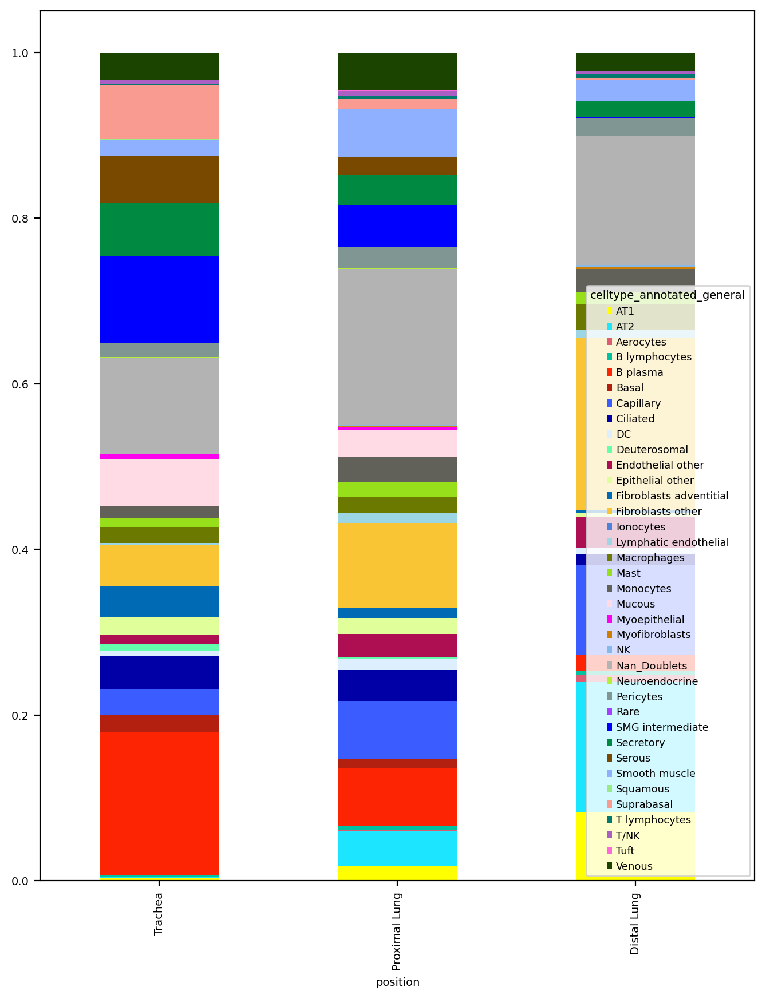

In [52]:
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=100, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
freqs=pd.crosstab(adatall.obs['position'],adatall.obs['celltype_annotated_general'])
##freqs=freqs.iloc[[0,3,5,8,4,6,9,2,1,7,10],:]
fig=plt.figure()
freqsnorm=freqs.div(freqs.sum(axis=1),axis=0)
freqsnorm=freqsnorm.loc[['Trachea','Proximal Lung','Distal Lung'],:]
freqsnorm.plot(kind='bar',stacked=True,figsize=(8,10),color=adatall.uns['celltype_annotated_general_colors'])
plt.grid(False)
plt.savefig('/mnt/f/ISS/plots_for_publication/barplot_relative_frequency_ISS_celltype_annotated_broad.pdf')

# Evaluating changes within each group

In [ ]:
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=100, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
freqs_class=pd.crosstab(adatall.obs['position'],adatall.obs['cell_class'])
for c in adatall.obs['cell_class'].unique():
    adatasub=adatall[adatall.obs['cell_class']==c]
    freqs=pd.crosstab(adatasub.obs['position'],adatasub.obs['celltype_annotated_general'])
    ##freqs=freqs.iloc[[0,3,5,8,4,6,9,2,1,7,10],:]
    fig=plt.figure(figsize=(5,8))
    freqsnorms=freqs.div(freqs.sum(axis=1),axis=0)
    freqsnorms=freqsnorms.loc[['Trachea','Proximal Lung','Distal Lung'],:]
    sc.set_figure_params(figsize=(3,3),dpi=100)
#    try:
    freqsnorms.plot(kind='bar',stacked=True,figsize=(7,7),color=[dictio[s] for s in freqsnorms.columns],grid=False)
    plt.savefig('/mnt/f/ISS/plots_for_publication/barplot_relative_frequency_ISS_level2_'+str(c)+'_relative.svg')
    import seaborn as sns
    plt.figure()
    matplotlib.rcParams['pdf.fonttype'] = 42
    matplotlib.rcParams['ps.fonttype'] = 42
    sns.set(rc={'figure.figsize':(9,2)})
    sns.heatmap(freqsnorms.transpose(),cmap='Blues',vmax=0.4)
    plt.savefig('/mnt/f/ISS/plots_for_publication/heatmap_relative_frequency_ISS_level2_'+str(c)+'_relative.svg')
#    except:
#        print(str(c)+' not possible')

In [ ]:
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=100, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
freqs_class=pd.crosstab(adatall.obs['position'],adatall.obs['cell_class'])
for c in adatall.obs['cell_class'].unique():
    adatasub=adatall[adatall.obs['cell_class']==c]
    freqs=pd.crosstab(adatasub.obs['position'],adatasub.obs['celltype_annotated_general'])
    ##freqs=freqs.iloc[[0,3,5,8,4,6,9,2,1,7,10],:]
    fig=plt.figure(figsize=(5,8))
    freqsnorms=freqs.div(freqs_class.sum(axis=1),axis=0)
    freqsnorms=freqsnorms.loc[['Trachea','Proximal Lung','Distal Lung'],:]
    sc.set_figure_params(figsize=(3,3),dpi=100)
    try:
        freqsnorms.plot(kind='bar',stacked=True,figsize=(7,7),color=[dictio[s] for s in freqsnorms.columns],grid=False)
        plt.savefig('/mnt/f/ISS/plots_for_publication/barplot_relative_frequency_ISS_level2_'+str(c)+'_relative.pdf')
    except:
        print(str(c)+' not possible')

# Look at the 3rd level (Normalized by region)

In [ ]:
sc.settings.set_figure_params(transparent=True)
sc.set_figure_params(figsize=(9,8),dpi=300)
sc.pl.umap(adatall,color='celltype_annotated_refined',size=8,legend_fontsize=5,legend_fontoutline=0.8,legend_fontweight='semibold',save='annotated_clusters_celltype_annotated_refined_nooutline_size8.pdf')

In [56]:
ct_refined_colors=dict(zip(np.unique(adatall.obs['celltype_annotated_refined']),adatall.uns['celltype_annotated_refined_colors']))

In [92]:
adatall.write('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_adata4_211123_with_colors_&refined.h5ad')

In [2]:
import scanpy as sc
adatall=sc.read('/Users/sergio/Downloads/adata_16samples_clustered_log_annotated_curated_notln_adata4_211123_with_colors_&refined.h5ad')

/opt/anaconda3/envs/sccellfie/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [ ]:
for c in adatall.obs['cell_class'].unique():
    adatasub=adatall[adatall.obs['cell_class']==c]
    freqs=pd.crosstab(adatasub.obs['position'],adatasub.obs['celltype_annotated_general'])
    for cc in freqs.columns:
        try:
            print(cc)
            adatasub=adatall[adatall.obs['celltype_annotated_general']==cc]
            ##freqs=freqs.iloc[[0,3,5,8,4,6,9,2,1,7,10],:]
            freqss=pd.crosstab(adatasub.obs['position'],adatasub.obs['celltype_annotated_refined'])
            freqss=freqss.loc[:,~freqss.columns.isin(['?'])]
            fig=plt.figure()
            freqsnorms=freqss.div(freqs.sum(axis=1),axis=0)
            freqsnorms=freqsnorms.loc[['Trachea','Proximal Lung','Distal Lung'],:]
            sc.set_figure_params(figsize=(3,3),dpi=100)
            ax=freqsnorms.plot(kind='bar',stacked=True,figsize=(8,10),color=[ct_refined_colors[s] for s in freqsnorms.columns],grid=False)
            #plt.legend(loc='upper right')
            ## Put a legend to the right of the current axis
            ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
            plt.savefig('/mnt/f/ISS/plots_for_publication/barplot_relative_frequency_level3/barplot_relative_frequency_ISS_level3_'+str(cc)+'_relative.pdf')
        except:
            print('Not possible')

# Specific code for plotting all fibroblasts together in the same plot

In [78]:
adatall2=adatall[:]
adatall2.obs['celltype_merged_fibroblasts']=adatall2.obs['celltype_annotated_general']

/tmp/ipykernel_87/1396594112.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adatall2.obs['celltype_merged_fibroblasts']=adatall2.obs['celltype_annotated_general']
/home/sergioms/miniconda3/envs/spatial2022/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/sergioms/miniconda3/envs/spatial2022/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [81]:
adatall2.obs.loc[adatall2.obs['celltype_merged_fibroblasts']=='Fibroblasts adventitial','celltype_merged_fibroblasts']='Fibroblasts other'

In [82]:
freqs=pd.crosstab(adatasub.obs['position'],adatasub.obs['celltype_merged_fibroblasts'])

In [ ]:
for c in adatall2.obs['cell_class'].unique():
    adatasub=adatall2[adatall2.obs['cell_class']==c]
    freqs=pd.crosstab(adatasub.obs['position'],adatasub.obs['celltype_merged_fibroblasts'])
    print(freqs)
    for cc in freqs.columns:
        if cc=='Fibroblasts other':
            try:
                print(cc)
                adatasub=adatall2[adatall2.obs['celltype_merged_fibroblasts']==cc]
                ##freqs=freqs.iloc[[0,3,5,8,4,6,9,2,1,7,10],:]
                freqss=pd.crosstab(adatasub.obs['position'],adatasub.obs['celltype_annotated_refined'])
                freqss=freqss.loc[:,~freqss.columns.isin(['?'])]
                fig=plt.figure()
                freqsnorms=freqss.div(freqs.sum(axis=1),axis=0)
                freqsnorms=freqsnorms.loc[['Trachea','Proximal Lung','Distal Lung'],:]
                sc.set_figure_params(figsize=(3,3),dpi=100)
                ax=freqsnorms.plot(kind='bar',stacked=True,figsize=(8,10),color=[ct_refined_colors[s] for s in freqsnorms.columns],grid=False)
                #plt.legend(loc='upper right')
                ## Put a legend to the right of the current axis
                ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
                plt.savefig('/mnt/f/ISS/plots_for_publication/barplot_relative_frequency_level3/barplot_relative_frequency_ISS_level3_'+str(cc)+'_relative_merged_fibroblasts.pdf')
            except:
                print('Not possible')

In [83]:
adatasub=adatall[adatall.obs['cell_class']==c]
freqs=pd.crosstab(adatasub.obs['position'],adatasub.obs['celltype_annotated_general'])

In [ ]:
for c in ['Bronchial epithelial']:
    adatasub=adatall[adatall.obs['cell_class']==c]
    freqs=pd.crosstab(adatasub.obs['position'],adatasub.obs['celltype_annotated_general'])
    for cc in freqs.columns:
        try:
            print(cc)
            adatasub=adatall[adatall.obs['celltype_annotated_general'].isin([cc,'Basal'])]
            ##freqs=freqs.iloc[[0,3,5,8,4,6,9,2,1,7,10],:]
            freqss=pd.crosstab(adatasub.obs['position'],adatasub.obs['celltype_annotated_refined'])
            freqss=freqss.loc[:,~freqss.columns.isin(['?'])]
            fig=plt.figure()
            freqsnorms=freqss.div(freqs.sum(axis=1),axis=0)
            freqsnorms=freqsnorms.loc[['Trachea','Proximal Lung','Distal Lung'],:]
            sc.set_figure_params(figsize=(3,3),dpi=100)
            ax=freqsnorms.plot(kind='bar',stacked=True,figsize=(8,10),color=[ct_refined_colors[s] for s in freqsnorms.columns],grid=False)
            #plt.legend(loc='upper right')
            ## Put a legend to the right of the current axis
            ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
            if cc=='Suprabasal':
                plt.savefig('/mnt/f/ISS/plots_for_publication/barplot_relative_frequency_level3/barplot_relative_frequency_ISS_level3_'+str(cc)+'_suprabasal'+'_relative.pdf')
        except:
            print('Not possible')

In [ ]:
for c in ['Bronchial epithelial']:
    adatasub=adatall[adatall.obs['cell_class']==c]
    freqs=pd.crosstab(adatasub.obs['position'],adatasub.obs['celltype_annotated_general'])
    for cc in freqs.columns:
        try:
            print(cc)
            adatasub=adatall[adatall.obs['celltype_annotated_general'].isin([cc,'Basal'])]
            ##freqs=freqs.iloc[[0,3,5,8,4,6,9,2,1,7,10],:]
            freqss=pd.crosstab(adatasub.obs['position'],adatasub.obs['celltype_annotated_refined'])
            freqss=freqss.loc[:,~freqss.columns.isin(['?'])]
            fig=plt.figure()
            freqsnorms=freqss.div(freqs.sum(axis=1),axis=0)
            freqsnorms=freqsnorms.loc[['Trachea','Proximal Lung','Distal Lung'],:]
            sc.set_figure_params(figsize=(3,3),dpi=100)
            ax=freqsnorms.plot(kind='bar',stacked=True,figsize=(8,10),color=[ct_refined_colors[s] for s in freqsnorms.columns],grid=False)
            #plt.legend(loc='upper right')
            ## Put a legend to the right of the current axis
            ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
            if cc=='Suprabasal':
                plt.savefig('/mnt/f/ISS/plots_for_publication/barplot_relative_frequency_level3/barplot_relative_frequency_ISS_level3_'+str(cc)+'_suprabasal'+'_relative.pdf')
        except:
            print('Not possible')

# Plots for LNG156

In [ ]:
for c in adatall.obs['cell_class'].unique():
    adatasub=adatall[adatall.obs['cell_class']==c]
    freqs=pd.crosstab(adatasub.obs['region'],adatasub.obs['celltype_annotated_general'])
    for cc in freqs.columns:
        try:
#            print(cc)
            if cc=='Capillary':
                adatasub=adatall[adatall.obs['celltype_annotated_general'].isin(['Capillary','Aerocytes'])]
                ##freqs=freqs.iloc[[0,3,5,8,4,6,9,2,1,7,10],:]
                freqss=pd.crosstab(adatasub.obs['region'],adatasub.obs['celltype_annotated_refined'])
                freqss=freqss.loc[:,~freqss.columns.isin(['?'])]
                fig=plt.figure()
                freqsnorms=freqss.div(freqs.sum(axis=1),axis=0)
                freqsnorms=freqsnorms.loc[['LNG1','LNG5','LNG6'],:]
                sc.set_figure_params(figsize=(3,3),dpi=100)
                freqsnorms.plot(kind='area',stacked=True,figsize=(8,10),colormap='tab20',grid=False)
                plt.savefig('/mnt/f/ISS/plots_for_publication/barplot_relative_frequency_level3/areaplot_lng156_relative_frequency_ISS_level3_'+str(c)+'_with_aerocytes_relative.pdf')
        except:
            print('Not possible')

In [ ]:
for c in adatall.obs['cell_class'].unique():
    adatasub=adatall[adatall.obs['cell_class']==c]
    freqs=pd.crosstab(adatasub.obs['region'],adatasub.obs['celltype_annotated_general'])
    for cc in freqs.columns:
        try:
            adatasub=adatall[adatall.obs['celltype_annotated_general']==cc]
            ##freqs=freqs.iloc[[0,3,5,8,4,6,9,2,1,7,10],:]
            freqss=pd.crosstab(adatasub.obs['region'],adatasub.obs['celltype_annotated_refined'])
            freqss=freqss.loc[:,~freqss.columns.isin(['?'])]
            fig=plt.figure()
            freqsnorms=freqss.div(freqs.sum(axis=1),axis=0)
            freqsnorms=freqsnorms.loc[['LNG1','LNG5','LNG6'],:]
            sc.set_figure_params(figsize=(3,3),dpi=100)
            freqsnorms.plot(kind='bar',stacked=True,figsize=(8,10),colormap='tab20',grid=False)
            plt.savefig('/mnt/f/ISS/plots_for_publication/barplot_relative_frequency_level3/barplot_lng156_relative_frequency_ISS_level3_'+str(c)+'_relative.pdf')
        except:
            print('Not possible')

In [ ]:
for c in adatall.obs['cell_class'].unique():
    adatasub=adatall[adatall.obs['cell_class']==c]
    freqs=pd.crosstab(adatasub.obs['region'],adatasub.obs['celltype_annotated_general'])
    for cc in freqs.columns:
        try:
            print(cc)
            adatasub=adatall[adatall.obs['celltype_annotated_general']==cc]
            ##freqs=freqs.iloc[[0,3,5,8,4,6,9,2,1,7,10],:]
            freqss=pd.crosstab(adatasub.obs['region'],adatasub.obs['celltype_annotated_refined'])
            freqss=freqss.loc[:,~freqss.columns.isin(['?'])]
            fig=plt.figure()
            freqsnorms=freqss.div(freqs.sum(axis=1),axis=0)
            freqsnorms=freqsnorms.loc[['LNG1','LNG5','LNG6'],:]
            sc.set_figure_params(figsize=(3,3),dpi=100)
            freqsnorms.plot(kind='bar',stacked=True,figsize=(8,10),colormap='tab20',grid=False)
            plt.savefig('/mnt/f/ISS/plots_for_publication/barplot_relative_frequency_level3/barplot_lng156_relative_frequency_ISS_level3_'+str(c)+'_relative.pdf')
        except:
            print('Not possible')

# take a look at DEG between regions for specific cell type (at the intermediate level)

In [89]:
adatall=adatall[~adatall.obs['celltype_annotated_general'].isin(['Doublets','Nan','nan','Fibroblasts','Mesenchymal','Epithelial unknown'])]

In [90]:
adatall.obs['celltype_annotated_general'].unique()

['Nan_Doublets', 'Ciliated', 'Suprabasal', 'Monocytes', 'Myoepithelial', ..., 'Ionocytes', 'Rare', 'Aerocytes', 'NK', 'Tuft']
Length: 37
Categories (37, object): ['AT1', 'AT2', 'Aerocytes', 'B lymphocytes', ..., 'T lymphocytes', 'T/NK', 'Tuft', 'Venous']

In [91]:
# we calculate the pvalue to use with a bonferroni approach
# 0.05/ (n genes*n conditions*n celltypes)
0.05/(27*3*161)

3.834061805076298e-06

In [20]:
d={}
import warnings
warnings.filterwarnings("ignore")
for c in freqsnorm.columns:
    adatasub=adatall[adatall.obs['cell_class']==c]
    freqs=pd.crosstab(adatasub.obs['region'],adatasub.obs['celltype_annotated_general'])
    for cc in freqs.columns:
        try:
            adatasub=adatall[adatall.obs['celltype_annotated_general']==cc]
            ##freqs=freqs.iloc[[0,3,5,8,4,6,9,2,1,7,10],:]
            freqss=pd.crosstab(adatasub.obs['region'],adatasub.obs['celltype_annotated_refined'])
            freqss=freqss.loc[:,~freqss.columns.isin(['?'])]
             ##freqs=freqs.iloc[[0,3,5,8,4,6,9,2,1,7,10],:]
            #fig=plt.figure()
            #freqsnormss=freqss.div(freqss.sum(axis=1),axis=0)
            #freqsnormss=freqsnormss.loc[['LNG2','LNG3','LNG5','LNG6','LNG1'],:]
            #sc.set_figure_params(figsize=(3,3),dpi=100)
            #freqsnormss.plot(kind='bar',stacked=True,figsize=(8,10),colormap='Accent')
            sc.pp.log1p(adatasub)
            sc.tl.rank_genes_groups(adatasub, 'position', method='t-test', key_added = "t-test")
            sc.pl.rank_genes_groups_dotplot(adatasub, n_genes=8, key = "t-test")
            print('The previous plot was ' + cc)
            #sc.pl.dotplot
            signif=[]
            for s in range(0,len(adatasub.uns['t-test']['names'])):
                for n in range(0,3):
                        if adatasub.uns['t-test']['pvals'][s][n]<3.834061805076298e-06:
                            if adatasub.uns['t-test']['scores'][s][n]>10:
                                signif.append(adatasub.uns['t-test']['names'][s][n])
                        #['logfoldchanges']
            d[cc]=signif
        except:
            print('Not possible')
    
    
    

NameError: name 'freqsnorm' is not defined

In [79]:
gns=[]
numberofgenes=[]
for ls in d.values():
    gns=gns+ls
    numberofgenes.append(len(ls))

In [80]:
DEGgenes=pd.DataFrame(index=adatall.obs['celltype_annotated_general'].unique(),columns=adatall.raw.var.index)
DEGgenes=DEGgenes.fillna(0)
for l in d:
    ls=d[l]
    ks=l
    for g in adatall.raw.var.index:
        if g in ls:
            DEGgenes.loc[ks,g]=1
#            numberofgenes.append(len(ls))

In [81]:
DEGtable=DEGgenes.loc[:,np.sum(DEGgenes)>0]

In [91]:
DEG_ngenes=pd.DataFrame(np.sum(DEGtable,axis=0),columns=['ngenes']).sort_values(by='ngenes')

In [ ]:
DEG_ngenes.plot(kind='barh',figsize=(16,16),color='black',width=1,grid=False)


In [ ]:
sc.pl.dotplot(adatall,['SFTPB','GPX3','SFTPA1'],groupby='celltype_region')

In [ ]:
import seaborn as sns
sns.clustermap(DEGtable)

In [52]:
deg_by_celltype=pd.DataFrame(numberofgenes,d.keys())

In [ ]:
deg_by_celltype.plot(kind='bar')

# Look at DEG in the same way as in the other one 

In [ ]:
adata=adatall
adata.obs['location']=adata.obs['position']
adata.obs['location'].unique()
sc.pp.log1p(adata)
listofresults_broad=[]
celltypes_used_broad=[]
listofpvals_broad=[]
listoflogs_broad=[]
from tqdm import tqdm
for ct in tqdm(adata.obs.celltype_annotated_general.unique()):
    print(ct)
    subadata=adata[adata.obs['celltype_annotated_general']==ct]
    if np.sum(subadata.obs.groupby('location').count()['celltype_annotated_general']>10)==3:
        celltypes_used_broad.append(ct)
        sc.tl.rank_genes_groups(subadata, 'location', method='wilcoxon', key_added = "wilcoxon")
        sc.pl.rank_genes_groups(subadata, n_genes=10, sharey=False, key="wilcoxon")
        names=subadata.uns['wilcoxon']['names']
        logfold=subadata.uns['wilcoxon']['scores']
        results=pd.DataFrame(columns=adata.obs['location'].unique(),index=adata.var.index)
        regiontocolumn=dict(zip([0,1,2],['Trachea', 'Bronchi', 'Parenchyma']))
        for num in range(0,len(names)):
            values=logfold[num]
            genes=names[num]
            for gennum in range(0,len(genes)):
                results.loc[genes[gennum],regiontocolumn[gennum]]=values[gennum]
        pvals=subadata.uns['wilcoxon']['pvals']#['logfoldchanges']
        resultspvals=pd.DataFrame(columns=adata.obs['location'].unique(),index=adata.var.index)
        regiontocolumn=dict(zip([0,1,2],['Trachea', 'Bronchi', 'Parenchyma']))
        for num in range(0,len(names)):
            values=pvals[num]
            genes=names[num]
            for gennum in range(0,len(genes)):
                resultspvals.loc[genes[gennum],regiontocolumn[gennum]]=values[gennum]
        
        logs=subadata.uns['wilcoxon']['logfoldchanges']
        resultslogs=pd.DataFrame(columns=adata.obs['location'].unique(),index=adata.var.index)
        regiontocolumn=dict(zip([0,1,2],['Trachea', 'Bronchi', 'Parenchyma']))
        for num in range(0,len(names)):
            values=logs[num]
            genes=names[num]
            for gennum in range(0,len(genes)):
                resultslogs.loc[genes[gennum],regiontocolumn[gennum]]=values[gennum]

        listoflogs_broad.append(resultslogs)
        listofresults_broad.append(results)
        listofpvals_broad.append(resultspvals)

In [90]:
adata.obs['celltype_loc']=adata.obs['celltype_annotated_general'].astype(str)+'_'+adata.obs['location'].astype(str)
commoncelltypes=celltypes_used_broad#
commonframework=pd.DataFrame(index=celltypes_used_broad,columns=adata.var.index)
ct1=commoncelltypes[1]
vals_2locs=[]
listvals_2locs=[]
celltype=ct1
col=0
for ct in celltypes_used_broad:
    if ct==celltype:
        cs=col
    col=col+1   
repres=listofresults_broad[cs]
pvalres=listofpvals_broad[cs]
cellres=celltypes_used_broad[cs]
logsres=listoflogs_broad[cs]
logres=listoflogs_broad[cs]
repres_filt=repres.loc[np.sum(pvalres<3.834061805076298e-06,axis=1)>0,:]
#repres_filt=repres.loc[np.sum(logres>0.25,axis=1)>0,:]
repres_filt.shape
repres_filt=repres_filt.astype(float)
repres_filt=repres_filt.loc[:,['Trachea', 'Bronchi', 'Parenchyma']]
repres=repres.loc[:,['Trachea', 'Bronchi', 'Parenchyma']]
repres_filt=repres_filt.loc[repres_filt.astype(float).idxmax(axis=1).sort_values().index,:]
#    fig, ax = plt.subplots(figsize=(4,7))  
#    sns.heatmap(repres_filt.astype(float),vmax=20,vmin=-20,cmap='coolwarm')
#    plt.title(celltype)
repres1=repres_filt
for ct2 in tqdm(celltypes_used_broad):
        celltype=ct2
        col=0
        for ct in celltypes_used_broad:
            if ct==celltype:
                cs=col
            col=col+1   
        repres=listofresults_broad[cs]
        pvalres=listofpvals_broad[cs]
        cellres=celltypes_used_broad[cs]
        logres=listoflogs_broad[cs]
#        repres_filt=repres.loc[np.sum(pvalres<0.001,axis=1)>0,:]
#        logres_filt=logres.loc[np.sum(pvalres<0.001,axis=1)>0,:]
#        repres_filt=repres_filt.loc[np.sum(logres_filt>2.5,axis=1)>0,:]
        repres_filt=repres
        logres_filt=logres
        repres_filt.shape
        repres_filt=repres_filt.astype(float)
        repres_filt=repres_filt.loc[:,['Trachea', 'Bronchi', 'Parenchyma']]
        repres=repres.loc[:,['Trachea', 'Bronchi', 'Parenchyma']]
        repres_filt=repres_filt.loc[repres_filt.astype(float).idxmax(axis=1).sort_values().index,:]
#            fig, ax = plt.subplots(figsize=(4,7))  
#            sns.heatmap(repres_filt.astype(float),vmax=20,vmin=-20,cmap='coolwarm')
#            plt.title(celltype)
        repres2=repres_filt
#        repres2=repres2.loc[repres2.index.isin(cmn_2locs),:]
#       if ct1!=ct2:
        try:
            for g in repres2.index:
                commonframework.loc[ct2,g]=repres2.loc[g,'Trachea']
           # for g in no_common:
           #     commonframework.loc[ct2,g]=0
            listvals_2locs.append(common)
            vals_2locs.append(len(common))
        except:
            listvals_2locs.append([])
            vals_2locs.append(0)   
            
common_trachea=commonframework
commonframework.to_csv('/mnt/d/scRNAseq_kerstin/degs_3locs/trachea_ISS_scores.csv')

100%|███████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 81.70it/s]


In [ ]:
score=10
#epict=['AT1','AT2','Basal','Secretory_Club','Suprabasal','Secretory_Goblet','Ciliated']
common_trachea=common_trachea.fillna(0)
common_trachea_filt=common_trachea.loc[:,np.max(abs(common_trachea),axis=0)>score]
sns.clustermap(common_trachea_filt.astype(float),cmap='coolwarm',vmin=-10,vmax=10,figsize=(15,15))

# Agreement between both

In [37]:
ISS_scores=pd.read_csv('/mnt/d/scRNAseq_kerstin/degs_3locs/trachea_ISS_scores.csv',index_col=0)
SC_scores=pd.read_csv('/mnt/d/scRNAseq_kerstin/degs_3locs/a_trachea.csv',index_col=0)
ISS_scores.index=['Ciliated', 'Suprabasal', 'Monocytes', 'Secretory_Club', 'Serous', 'T cell',
       'Capillary', 'Mast cells', 'Deuterosomal', 'Goblet', 'Smooth muscle',
       'Venous', 'Fibro_alveolar', 'AT2', 'Myoepithelial', 'Muscle_pericyte_pulmonary',
       'Arterial', 'B lymphocytes', 'Mucous', 'AT1', 'Fibroblast general',
       'Neuroendocrine','Endothelia_Lymphatic', 'Basal', 'Rare', 'DC']
SC_scores=SC_scores.loc[SC_scores.index.isin(ISS_scores.index),SC_scores.columns.isin(ISS_scores.columns)]
ISS_scores=ISS_scores.loc[SC_scores.index,SC_scores.columns]
MULTISCORES=ISS_scores*SC_scores
MULTISCORES=MULTISCORES.loc[:,np.max(abs(MULTISCORES),axis=0)>5]

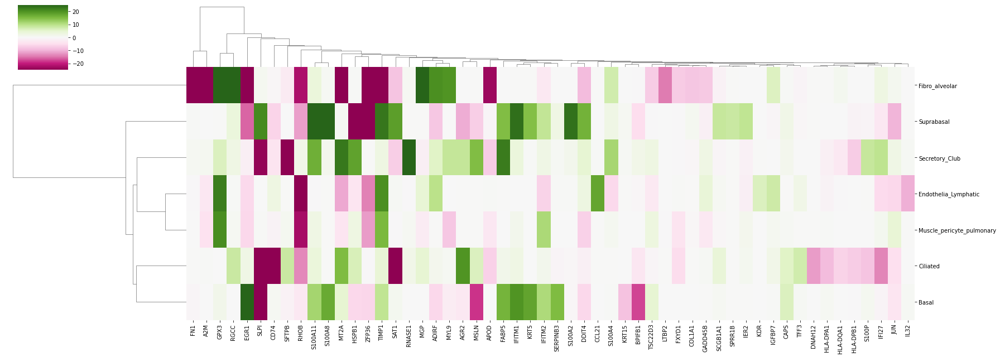

In [55]:
import seaborn as sns
sns.clustermap(MULTISCORES,cmap='PiYG',vmin=-25,vmax=25,figsize=(25,9))

In [ ]:
for n in MULTISCORES.columns:
    import numpy as np
    import matplotlib.pyplot as plt

    # set width of bar
    barWidth = 0.25
    fig = plt.subplots(figsize =(12, 3))

    # set height of bar
    IT = list(SC_scores.loc[:,n])
    ECE = list(ISS_scores.loc[:,n])
    CSE = [29, 3, 24, 25, 17]

    # Set position of bar on X axis
    br1 = np.arange(len(IT))
    br2 = [x + barWidth for x in br1]
    br3 = [x + barWidth for x in br2]

    # Make the plot
    plt.bar(br1, IT, color ='m', width = barWidth,
            edgecolor ='grey', label ='SC')
    plt.bar(br2, ECE, color ='g', width = barWidth,
            edgecolor ='grey', label ='ISS')
    plt.xlabel('Cell types', fontweight ='bold', fontsize = 15)
    plt.xticks([r + barWidth for r in range(len(list(SC_scores.index)))],
            list(SC_scores.index))
    plt.title(n)
    plt.legend()
    plt.show()

# Look at sample-specific differences

In [32]:
reg=[e[-4:] for e in adata.obs['sample']]
samp=[e[:4] for e in adata.obs['sample']]
adata.obs['reg']=list(reg)
adata.obs['samp']=list(samp)

In [85]:
adata.obs['regsamp']=adata.obs['reg']+'_'+adata.obs['samp']

In [ ]:
for ct in adata.obs['celltype_annotated_general'].unique():
    adatasub=adata[adata.obs['celltype_annotated_general']==ct]
    print(ct)
    sc.pl.dotplot(adatasub,MULTISCORES.columns,groupby='regsamp')   

In [87]:
adata

AnnData object with n_obs × n_vars = 221490 × 159
    obs: 'cell', 'x', 'y', 'cluster', 'n_transcripts', 'density', 'elongation', 'area', 'avg_confidence', 'sample', 'region', 'n_genes', 'n_counts', 'counts_markers', 'leiden2', 'reference', 'old_annotation', 'annotation_3', 'annotation_2', 'annotation_1', 'leiden', 'previous_annotation', 'celltype_annotated', 'celltype_annotated_epi', 'ID', 'celltype_annotated_refined', 'celltype_annotated_general', 'cell_class', 'X', 'Y', 'position', 'location', 'celltype_loc', 'reg', 'samp', 'regsamp'
    uns: 'celltype_annotated_colors', 'celltype_annotated_epi_colors', 'dendrogram_leiden', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'rank_genes_groups', 'umap', 'celltype_annotated_general_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [ ]:
sc.tl.rank_genes_groups(adata,'samp', method='t-test', key_added = "t-test")
sc.pl.rank_genes_groups(adata, n_genes=16, key = "t-test")

# analysis on specific samples

In [96]:
reg=[e[-4:] for e in adatall.obs['sample']]
samp=[e[:4] for e in adatall.obs['sample']]
adatall.obs['reg']=list(reg)
adatall.obs['samp']=list(samp)

In [ ]:
for ss in adatall.obs['samp'].unique():
    adata=adatall[adatall.obs['samp']==ss]
    adata.obs['location']=adata.obs['position']
    adata.obs['location'].unique()
    sc.pp.log1p(adata)
    listofresults_broad=[]
    celltypes_used_broad=[]
    listofpvals_broad=[]
    listoflogs_broad=[]
    from tqdm import tqdm
    for ct in tqdm(adata.obs.celltype_annotated_general.unique()):
        print(ct)
        subadata2=adatall[adatall.obs['celltype_annotated_general']==ct]
        subadata=adata[adata.obs['celltype_annotated_general']==ct]
        if np.sum(subadata2.obs.groupby('location').count()['celltype_annotated_general']>10)==3:
            celltypes_used_broad.append(ct)
            sc.tl.rank_genes_groups(subadata, 'location', method='wilcoxon', key_added = "wilcoxon")
            sc.pl.rank_genes_groups(subadata, n_genes=10, sharey=False, key="wilcoxon")
            names=subadata.uns['wilcoxon']['names']
            logfold=subadata.uns['wilcoxon']['scores']
            results=pd.DataFrame(columns=adata.obs['location'].unique(),index=adata.var.index)
            regiontocolumn=dict(zip([0,1,2],['Trachea', 'Bronchi', 'Parenchyma']))
            for num in range(0,len(names)):
                values=logfold[num]
                genes=names[num]
                for gennum in range(0,len(genes)):
                    results.loc[genes[gennum],regiontocolumn[gennum]]=values[gennum]
            pvals=subadata.uns['wilcoxon']['pvals']#['logfoldchanges']
            resultspvals=pd.DataFrame(columns=adata.obs['location'].unique(),index=adata.var.index)
            regiontocolumn=dict(zip([0,1,2],['Trachea', 'Bronchi', 'Parenchyma']))
            for num in range(0,len(names)):
                values=pvals[num]
                genes=names[num]
                for gennum in range(0,len(genes)):
                    resultspvals.loc[genes[gennum],regiontocolumn[gennum]]=values[gennum]

            logs=subadata.uns['wilcoxon']['logfoldchanges']
            resultslogs=pd.DataFrame(columns=adata.obs['location'].unique(),index=adata.var.index)
            regiontocolumn=dict(zip([0,1,2],['Trachea', 'Bronchi', 'Parenchyma']))
            for num in range(0,len(names)):
                values=logs[num]
                genes=names[num]
                for gennum in range(0,len(genes)):
                    resultslogs.loc[genes[gennum],regiontocolumn[gennum]]=values[gennum]

            listoflogs_broad.append(resultslogs)
            listofresults_broad.append(results)
            listofpvals_broad.append(resultspvals)
    adata.obs['celltype_loc']=adata.obs['celltype_annotated_general'].astype(str)+'_'+adata.obs['location'].astype(str)
    commoncelltypes=celltypes_used_broad#
    commonframework=pd.DataFrame(index=celltypes_used_broad,columns=adata.var.index)
    ct1=commoncelltypes[1]
    vals_2locs=[]
    listvals_2locs=[]
    celltype=ct1
    col=0
    for ct in celltypes_used_broad:
        if ct==celltype:
            cs=col
        col=col+1   
    repres=listofresults_broad[cs]
    pvalres=listofpvals_broad[cs]
    cellres=celltypes_used_broad[cs]
    logsres=listoflogs_broad[cs]
    logres=listoflogs_broad[cs]
    repres_filt=repres.loc[np.sum(pvalres<3.834061805076298e-06,axis=1)>0,:]
    #repres_filt=repres.loc[np.sum(logres>0.25,axis=1)>0,:]
    repres_filt.shape
    repres_filt=repres_filt.astype(float)
    repres_filt=repres_filt.loc[:,['Trachea', 'Bronchi', 'Parenchyma']]
    repres=repres.loc[:,['Trachea', 'Bronchi', 'Parenchyma']]
    repres_filt=repres_filt.loc[repres_filt.astype(float).idxmax(axis=1).sort_values().index,:]
    #    fig, ax = plt.subplots(figsize=(4,7))  
    #    sns.heatmap(repres_filt.astype(float),vmax=20,vmin=-20,cmap='coolwarm')
    #    plt.title(celltype)
    repres1=repres_filt
    for ct2 in tqdm(celltypes_used_broad):
            celltype=ct2
            col=0
            for ct in celltypes_used_broad:
                if ct==celltype:
                    cs=col
                col=col+1   
            repres=listofresults_broad[cs]
            pvalres=listofpvals_broad[cs]
            cellres=celltypes_used_broad[cs]
            logres=listoflogs_broad[cs]
    #        repres_filt=repres.loc[np.sum(pvalres<0.001,axis=1)>0,:]
    #        logres_filt=logres.loc[np.sum(pvalres<0.001,axis=1)>0,:]
    #        repres_filt=repres_filt.loc[np.sum(logres_filt>2.5,axis=1)>0,:]
            repres_filt=repres
            logres_filt=logres
            repres_filt.shape
            repres_filt=repres_filt.astype(float)
            repres_filt=repres_filt.loc[:,['Trachea', 'Bronchi', 'Parenchyma']]
            repres=repres.loc[:,['Trachea', 'Bronchi', 'Parenchyma']]
            repres_filt=repres_filt.loc[repres_filt.astype(float).idxmax(axis=1).sort_values().index,:]
    #            fig, ax = plt.subplots(figsize=(4,7))  
    #            sns.heatmap(repres_filt.astype(float),vmax=20,vmin=-20,cmap='coolwarm')
    #            plt.title(celltype)
            repres2=repres_filt
    #        repres2=repres2.loc[repres2.index.isin(cmn_2locs),:]
    #       if ct1!=ct2:
            try:
                for g in repres2.index:
                    commonframework.loc[ct2,g]=repres2.loc[g,'Trachea']
               # for g in no_common:
               #     commonframework.loc[ct2,g]=0
                listvals_2locs.append(common)
                vals_2locs.append(len(common))
            except:
                listvals_2locs.append([])
                vals_2locs.append(0)   

    common_trachea=commonframework
    commonframework.to_csv('/mnt/d/scRNAseq_kerstin/degs_3locs/trachea_ISS_scores_'+str(ss)+'.csv')

In [124]:
#ISS_scores_640C.shape
#ISS_scores_588B.shape
ISS_scores_588B.shape

(21, 161)

In [125]:
ISS_scores_640C=pd.read_csv('/mnt/d/scRNAseq_kerstin/degs_3locs/trachea_ISS_scores_640C.csv',index_col=0)
ISS_scores_689C=pd.read_csv('/mnt/d/scRNAseq_kerstin/degs_3locs/trachea_ISS_scores_689C.csv',index_col=0)
ISS_scores_588B=pd.read_csv('/mnt/d/scRNAseq_kerstin/degs_3locs/trachea_ISS_scores_588B.csv',index_col=0)
ISS_scores_583B=pd.read_csv('/mnt/d/scRNAseq_kerstin/degs_3locs/trachea_ISS_scores_583B.csv',index_col=0)
SC_scores=pd.read_csv('/mnt/d/scRNAseq_kerstin/degs_3locs/a_trachea.csv',index_col=0)
nm=['Ciliated', 'Suprabasal', 'Monocytes', 'Secretory_Club', 'Serous', 'T cell',
       'Capillary', 'Mast cells', 'Deuterosomal', 'Goblet', 'Smooth muscle',
       'Venous', 'Fibro_alveolar', 'AT2', 'Myoepithelial', 'Muscle_pericyte_pulmonary',
       'Arterial', 'B lymphocytes', 'Mucous', 'AT1', 'Fibroblast general',
       'Neuroendocrine','Endothelia_Lymphatic', 'Basal', 'Rare', 'DC']
ISS_scores_640C.index=nm
ISS_scores_689C.index=nm
ISS_scores_588B.index=nm
ISS_scores_583B.index=nm
SC_scores=SC_scores.loc[SC_scores.index.isin(ISS_scores_640C.index),SC_scores.columns.isin(ISS_scores_640C.columns)]
ISS_scores_640C=ISS_scores_640C.loc[SC_scores.index,SC_scores.columns]
ISS_scores_689C=ISS_scores_689C.loc[SC_scores.index,SC_scores.columns]
ISS_scores_588B=ISS_scores_588B.loc[SC_scores.index,SC_scores.columns]
ISS_scores_583B=ISS_scores_583B.loc[SC_scores.index,SC_scores.columns]

In [ ]:
for n in MULTISCORES.columns:
    import numpy as np
    import matplotlib.pyplot as plt
    # set width of bar
    barWidth = 0.15
    fig = plt.subplots(figsize =(12, 3))
    # set height of bar
    IT = list(SC_scores.loc[:,n])
    ECE = list(ISS_scores_640C.loc[:,n])
    ECD = list(ISS_scores_689C.loc[:,n])
    ECF = list(ISS_scores_588B.loc[:,n])
    ECG = list(ISS_scores_583B.loc[:,n])

    # Set position of bar on X axis
    br1 = np.arange(len(IT))
    br2 = [x + barWidth for x in br1]
    br3 = [x + barWidth for x in br2]
    br4 = [x + barWidth for x in br3]
    br5 = [x + barWidth for x in br4]


    # Make the plot
    plt.bar(br1, IT, color ='m', width = barWidth,
            edgecolor ='grey', label ='SC')
    plt.bar(br2, ECE, color ='g', width = barWidth,
            edgecolor ='grey', label ='640C')
    plt.bar(br3, ECD, color ='#bafc03', width = barWidth,
            edgecolor ='grey', label ='689C')
    plt.bar(br4, ECF, color ='#54ebac', width = barWidth,
            edgecolor ='grey', label ='588B')
    plt.bar(br5, ECG, color ='#62c4be', width = barWidth,
            edgecolor ='grey', label ='583B')
    plt.xlabel('Cell types', fontweight ='bold', fontsize = 15)
    plt.xticks([r + barWidth for r in range(len(list(SC_scores.index)))],
            list(SC_scores.index))
    plt.title(n)
    plt.legend()
    plt.show()

In [ ]:
dt=pd.DataFrame([SC_scores.loc[:,n],ISS_scores.loc[:,n]])
    

In [278]:
expres=pd.DataFrame(adata.raw.X,columns=adata.raw.var.index)
expres.loc[:,['celltype']]=list(adata.obs['celltype_annotated_general'].astype(str))
meanexp=expres.groupby('celltype').mean()

In [ ]:
geneexpression=pd.DataFrame(meanexp.max(axis=0),columns=['expression'])
genescore=pd.DataFrame(np.sum(MULTISCORES,axis=0),columns=['agreement'])
expression_agreement=pd.merge(genescore,geneexpression,left_index=True, right_index=True)

In [ ]:
plt.scatter(expression_agreement['agreement'],expression_agreement['expression'])
for i in range(expression_agreement.shape[0]):
    plt.text(x=expression_agreement.iloc[i,0],y=expression_agreement.iloc[i,1],s=expression_agreement.index[i],size=8)

In [36]:
adatall.obs['celltype_region']=adatall.obs['celltype_annotated_general'].astype(str)+'_'+adatall.obs['position'].astype(str)

# Neiborhood enrichment

[FROM SQUIDPY TUTORIALS] We can investigate spatial organization of clusters in a quantitative way, by computing a neighborhood enrichment score. You can compute such score with the following function: squidpy.gr.nhood_enrichment(). In short, it’s an enrichment score on spatial proximity of clusters: if spots belonging to two different clusters are often close to each other, then they will have a high score and can be defined as being enriched. On the other hand, if they are far apart, the score will be low and they can be defined as depleted. This score is based on a permutation-based test, and you can set the number of permutations with the n_perms argument (default is 1000).

In [3]:
adata=adatall

In [4]:
adata.obsm["spatial"]=np.array([adata.obs.x,adata.obs.y,adata.obs.y]).transpose().astype('float64')

In [5]:
ad=adata

 in leica 20x a pixel=0.321um
60*0.321
we are considering arround 20um radius

In [8]:
anndata_list = []
for sample in ad.obs['sample'].unique():
    adata_copy_int = ad[ad.obs['sample']==sample]
    sq.gr.spatial_neighbors(adata_copy_int,radius=60.0,coord_type='generic')
    anndata_list.append(adata_copy_int)
ad_sp_concat = sc.concat(anndata_list, pairwise=True)

/home/sergioms/miniconda3/envs/spatial2022/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [9]:
adata=ad_sp_concat
adata.obs['name']=adata.obs['celltype_annotated_general'].astype('category')
adata=adata[~adata.obs['name'].isna()]
adata.obs['name']=adata.obs['celltype_annotated_general'].astype('category')

/tmp/ipykernel_170/176088161.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['name']=adata.obs['celltype_annotated_general'].astype('category')
/home/sergioms/miniconda3/envs/spatial2022/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [12]:
adatall.uns['celltype_annotated_general_colors']=[dictio[s] for s in  np.unique(adatall.obs['celltype_annotated_general'])]

In [ ]:
sc.pl.umap(adata,color='name')

In [15]:
adata.X=pd.DataFrame(adata.X).fillna(0)

In [33]:
#sq.gr.spatial_neighbors(adata,radius=50.0)
sq.gr.nhood_enrichment(adata, cluster_key="celltype_annotated_general")
adata.uns['celltype_annotated_general_nhood_enrichment']['zscore']=np.array(pd.DataFrame(adata.uns['celltype_annotated_general_nhood_enrichment']['zscore']).fillna(0))

  0%|          | 0/1000 [00:00<?, ?/s]

/home/sergioms/miniconda3/envs/spatial2022/lib/python3.9/site-packages/squidpy/gr/_nhood.py:182: RuntimeWarning: invalid value encountered in true_divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)


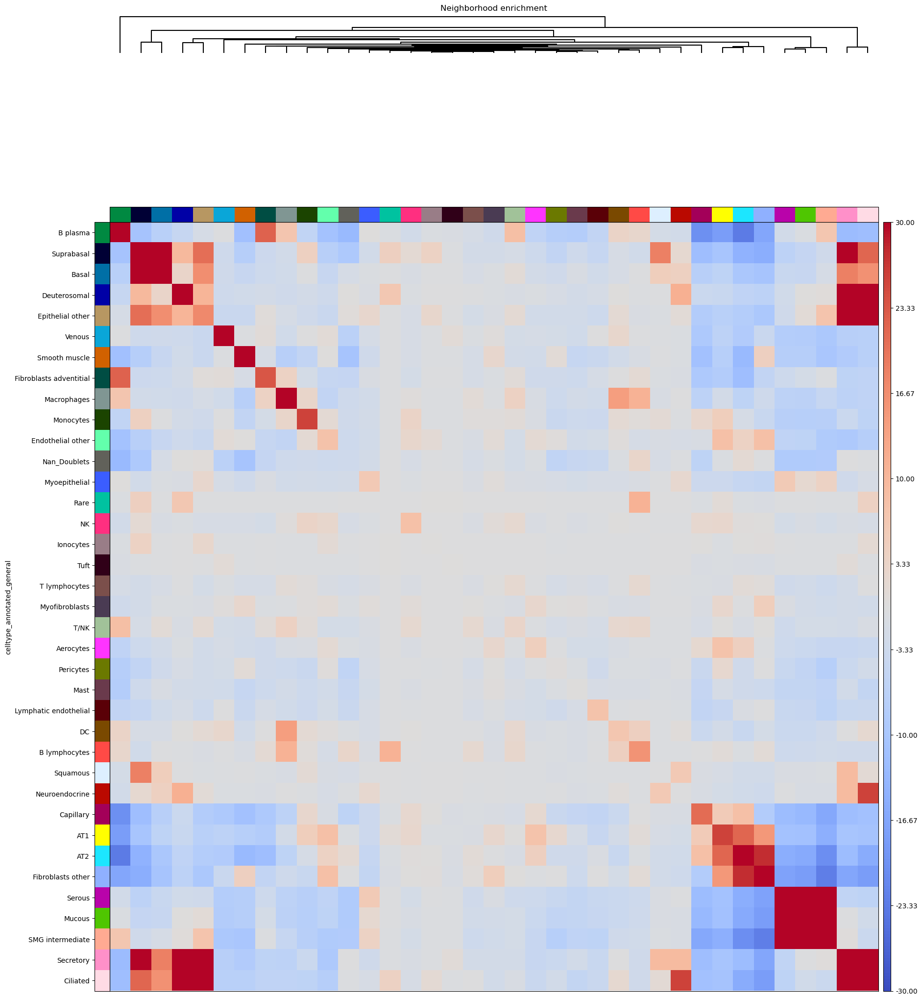

In [17]:
sq.pl.nhood_enrichment(adata,method='average', cluster_key="celltype_annotated_general",vmax=30,vmin=-30,figsize=(20,20),cmap='coolwarm',save='annotated_cluster_notln_vmax30_with_dendogram.pdf')

In [45]:
nhoods=pd.DataFrame(adata.uns['celltype_annotated_general_nhood_enrichment']['zscore']).copy()
nhoods.columns=np.unique(adata.obs['celltype_annotated_general'])
nhoods.index=np.unique(adata.obs['celltype_annotated_general'])

In [54]:
color_map = [dictio[node] for node in G]      

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
input_data =nhoods
#correlation = expression.corr(method='pearson')
input_data[input_data<2]=0
i2=input_data.loc[np.sum(input_data,axis=1)>0,np.sum(input_data,axis=1)>0]
for c in i2.columns:
    i2.loc[c,c]=0
G = nx.DiGraph(i2)
plt.figure(figsize=(10,7))
nx.draw(G,with_labels=True,node_size=40,font_size=8,width=0.3,node_color=color_map,arrows=False,
       edge_cmap= plt.cm.Blues)
plt.savefig('/mnt/c/Users/sergio.salas/Documents/PhD/JNotebooks/DiscovAIR/figures/edge_plot.svg',dpi=300)

Using this type of analysis, we can find colocalizing clusters (the ones with higher values). The higher the values are, the more enriched a cluster is next to a second cluster. This plot typically gives very high values for a pair of clusters and much lower values, but still interesting, for others, so it's important to play with the "vmax" parameter of the pl function and reduce the maximum value we can visualize to highlight differences between other clusters

# Properties of the spatial graph

Similar to the previous analysis, we can investigate properties of the spatial graph by computing different network centralities:

degree_centrality.

average_clustering.

closeness_centrality.

Squidpy provides a convenient function for all of them: squidpy.gr.centrality_scores() and squidpy.pl.centrality_scores() for visualization.

In [ ]:
sq.gr.centrality_scores(
    adata,
    cluster_key="name",
)
sq.pl.centrality_scores(adata, cluster_key="name", figsize=(20, 5), s=20)

A summary of what the statistics meaning is:

-’average_clustering’ - measure of the degree to which nodes cluster together.
-’closeness_centrality’ - measure of how close the group is to other nodes.
-’degree_centrality’ - fraction of non-group members connected to group members.

More information can be found in this publication: https://www.biorxiv.org/content/10.1101/2020.02.17.947416v3

# Analysis per sample

In [246]:
main='/mnt/e/iss/neighborhoods/sample_analysis'

In [296]:
sc.set_figure_params(figsize=(6,6),dpi=200)

In [ ]:
sc.pl.umap(adatasub.obs)

In [249]:
adatasub

AnnData object with n_obs × n_vars = 17112 × 159
    obs: 'cell', 'x', 'y', 'cluster', 'n_transcripts', 'density', 'elongation', 'area', 'avg_confidence', 'sample', 'region', 'n_genes', 'n_counts', 'counts_markers', 'leiden2', 'reference', 'old_annotation', 'annotation_3', 'annotation_2', 'annotation_1', 'leiden', 'previous_annotation', 'celltype_annotated', 'celltype_annotated_epi', 'ID', 'celltype_annotated_refined', 'celltype_annotated_general', 'cell_class', 'position', 'name'
    uns: 'name_nhood_enrichment', 'name_centrality_scores'
    obsm: 'X_pca', 'X_umap', 'spatial'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

In [ ]:
import seaborn as sns
samples=adata.obs['sample'].unique()
for s in samples:
    adata.uns['name_colors']=colors
    adatasub=adata[adata.obs['sample']==s]
    adatasub.X=pd.DataFrame(adatasub.X).fillna(0)
    #sq.gr.spatial_neighbors(adata,radius=50.0)

    sq.gr.nhood_enrichment(adatasub, cluster_key="name")
    adatasub.uns['name_nhood_enrichment']['zscore']=np.array(pd.DataFrame(adatasub.uns['name_nhood_enrichment']['zscore']).fillna(0))
    adatasub.uns['name_nhood_enrichment']['zscore'][adatasub.uns['name_nhood_enrichment']['zscore']>10000]=10000
    adatasub.uns['name_nhood_enrichment']['zscore'][adatasub.uns['name_nhood_enrichment']['zscore']<-10000]=-10000
    sq.pl.nhood_enrichment(adatasub,method='average', cluster_key="name",vmax=10,vmin=-10,figsize=(20,20),cmap='coolwarm',show=False)#,save='annotated_cluster_notln_vmax30_with_dendogram.pdf')
    plt.savefig(main+'/nhood_'+s+'.pdf')
    import collections
    counter = collections.Counter(adatasub.obs['name'])
    dic=dict(zip(adata.obs['name'].unique(),adata.uns['name_colors']))
    plt.figure(figsize=(10,10))
    colorsused=[dic[k] for k in counter.keys()]
    plt.pie(counter.values(), labels = counter.keys(),colors=colorsused)
    plt.savefig(main+'/pieplot_'+s+'.pdf')

    plt.figure(figsize=(10,20))
    sns.barplot(y=list(counter.keys()),x=list(counter.values()),palette=colorsused)
    plt.title(s)
    plt.savefig(main+'/barplot_'+s+'.pdf')
    #map_of_clusters(adatasub,key='name')
    adatasub.obs.X=adatasub.obs.x
    adatasub.obs.Y=adatasub.obs.y
    sc.pl.umap(adatasub,color='name')
    map_of_clusters(adatasub,key='name',figuresize=(10,10),size=5,save=main+'/'+s+'_')

In [ ]:


#sq.gr.spatial_neighbors(adata,radius=50.0)
sq.gr.nhood_enrichment(adata, cluster_key="name")

# Graph autocorrelation

With Squidpy we can investigate spatial variability of gene expression. squidpy.gr.spatial_autocorr() conveniently wraps two spatial autocorrelation statistics: Moran’s I and Geary’s C*. They provide a score on the degree of spatial variability of gene expression. The statistic as well as the p-value are computed for each gene, and FDR correction is performed. For the purpose of this tutorial, let’s compute the Moran’s I score. See Compute Moran’s I score for more details

In [79]:
adata

AnnData object with n_obs × n_vars = 87713 × 96
    obs: 'cell', 'x', 'y', 'cluster', 'n_transcripts', 'density', 'elongation', 'area', 'avg_confidence', 'sample', 'region', 'total_counts', 'n_genes', 'leiden', 'leiden2', 'X', 'Y', 'annotated_cluster', 'general_cluster', 'name'
    uns: 'name_nhood_enrichment', 'name_interactions', 'name_co_occurrence', 'name_centrality_scores'
    obsm: 'X_pca', 'X_umap', 'spatial'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

In [80]:
ad=sc.AnnData(adata.raw.X,var=adata.raw.var,obs=adata.obs,uns=adata.uns,obsm=adata.obsm)

/home/sergio/anaconda3/envs/scanpy_updated/lib/python3.7/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [83]:
ad.obsp=adata.obsp

In [85]:
adata

AnnData object with n_obs × n_vars = 87713 × 96
    obs: 'cell', 'x', 'y', 'cluster', 'n_transcripts', 'density', 'elongation', 'area', 'avg_confidence', 'sample', 'region', 'total_counts', 'n_genes', 'leiden', 'leiden2', 'X', 'Y', 'annotated_cluster', 'general_cluster', 'name'
    uns: 'name_nhood_enrichment', 'name_interactions', 'name_co_occurrence', 'name_centrality_scores'
    obsm: 'X_pca', 'X_umap', 'spatial'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

In [86]:
sq.gr.spatial_autocorr(ad, mode="moran")
ad.uns["moranI"].head(20)

,I,pval_norm,var_norm,pval_norm_fdr_bh
FCN3,0.458694,0.0,0.000006,0.0
LYZ,0.299699,0.0,0.000006,0.0
JCHAIN,0.200539,0.0,0.000006,0.0
TYROBP,0.172418,0.0,0.000006,0.0
CD74,0.156499,0.0,0.000006,0.0
ACKR1,0.152602,0.0,0.000006,0.0
CD79A,0.149248,0.0,0.000006,0.0
MYH11,0.137217,0.0,0.000006,0.0
ACTA2,0.115292,0.0,0.000006,0.0
CCL21,0.114918,0.0,0.000006,0.0


# Spatial organization of cell types (Ripley's K)

In addition to the neighbor enrichment score, we can further investigate spatial organization of cell types in tissue by means of the Ripley’s statistics. Ripley’s statistics allow analyst to evaluate whether a discrete annotation (e.g. cell-type) appears to be clustered, dispersed or randomly distributed on the area of interest. In Squidpy, we implement three closely related Ripley’s statistics, that can be easily computed with squidpy.gr.ripley(). Here, we’ll showcase the Ripley’s L statistic, which is a variance-stabilized version of the Ripley’s K statistics. We’ll visualize the results with squidpy.pl.ripley(). Check Compute Ripley’s statistics for more details.



In [ ]:
mode = "L"
sq.gr.ripley(adata, cluster_key="name", mode=mode, max_dist=1000)
sq.pl.ripley(adata, cluster_key="name", mode=mode)

In [ ]:
sc.tl.rank_genes_groups(adata,'celltype_annotated_general', method='t-test', key_added = "t-test")
sc.pl.rank_genes_groups(adata, n_genes=5, key = "t-test")

In [ ]:
adata=adatall[adatall.obs['celltype_annotated_general']=='Capillary']
#adata.obs['location']=adata.obs['position']
#adata.obs['location'].unique()
sc.pp.log1p(adata)
listofresults_broad=[]
celltypes_used_broad=[]
listofpvals_broad=[]
listoflogs_broad=[]
from tqdm import tqdm
for ct in tqdm(adata.obs.celltype_annotated_refined.unique()):
    adatasub=adata[adata.obs['celltype_annotated_refined']==ct]
#    sc.pl.umap(adata.obs)
    sc.pl.violin(adatasub,['DDIT4'],groupby='celltype_annotated_refined',figsize=(10,10))

In [107]:
adata2=adatall[adatall.obs['sample']=='588B_LNG2']

In [80]:
exp=pd.DataFrame(adata2.raw.X,columns=adata2.raw.var.index)

In [82]:
resi=pd.DataFrame(index=exp.columns,columns=exp.columns)
for c in tqdm(exp.columns):
    for d in exp.columns:
        resi.loc[c,d]=np.corrcoef(exp.loc[:,c],exp.loc[:,d])[0,1]

100%|█████████████████████████████████████████████████████████████████████████████████| 161/161 [00:10<00:00, 15.23it/s]


In [ ]:
# we select some genes
genes=['FOS','RPS29','RPL27A','ZFP36','JUN','HSPB1','LGALS1','IFITM2','IFITM3','CD9','EGR1','CST3',
'S100A11','IFITM1','RHOB','BTG1','IER2','SAT1','ZFP36L2','GADD45B','ANXA2','KLF6','TSC22D3','TXN','DDIT4','CYB5A','PRSS23',]

In [ ]:
resifilt=resi.loc[resi.index.isin(genes),resi.columns.isin(genes)]
import seaborn as sns
sns.clustermap(resifilt.astype(float),vmax=0.5,vmin=0)

In [ ]:
exp=pd.DataFrame(adata2.raw.X,columns=adata2.raw.var.index)
exp.loc[:,'celltype_annotated_general']=list(adata2.obs['celltype_annotated_general'])
exp=exp.groupby('celltype_annotated_general').mean()

In [104]:
resi=pd.DataFrame(index=exp.columns,columns=exp.columns)
for c in tqdm(exp.columns):
    for d in exp.columns:
        resi.loc[c,d]=np.corrcoef(exp.loc[:,c],exp.loc[:,d])[0,1]

100%|█████████████████████████████████████████████████████████████████████████████████| 161/161 [00:05<00:00, 31.76it/s]


In [ ]:
resifilt=resi.loc[resi.index.isin(genes),resi.columns.isin(genes)]
import seaborn as sns
sns.clustermap(resifilt.astype(float),vmax=1,vmin=0)

In [ ]:
selec=['B lymphocytes']
adata3=adata2[adata2.obs['celltype_annotated_general'].isin(selec)]

In [ ]:
sc.pp.log1p(adata3)
sc.set_figure_params(figsize=(9,8),dpi=500)
sc.pl.violin(adata3,['DDIT4','TSC22D3'],groupby='celltype_annotated_general',rotation=90)

In [137]:
expre=pd.DataFrame(adata3.raw.X,columns=adata3.raw.var.index)

# DEG plots_for_publication

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#import scipy.stats as st
import squidpy as sq
import scanpy as sc
import os

In [2]:
adatall=sc.read('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_090123_allcts_colors.h5ad')

/home/sergioms/miniconda3/envs/spatial2022/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [3]:
adatall.obs

,cell,x,y,cluster,n_transcripts,density,elongation,area,avg_confidence,sample,...,annotation_1,leiden,previous_annotation,celltype_annotated,celltype_annotated_epi,ID,celltype_annotated_refined,celltype_annotated_general,cell_class,position
0,1,1030.359227,8758.022170,3,16,0.008434,2.241,1897.00,1.0000,583B_LNG2,...,Secretory goblet,11,Fibro_or_vasc.,Epithelial,Epithelial TIMP1,1_583B_LNG2,Doublets epi-cap,Doublets,Doublets,Trachea
1,2,1025.261786,8821.652094,3,22,0.007242,1.528,3038.00,1.0000,583B_LNG2,...,Ciliated cells,6,Epithelial?,Epithelial,Ciliated,2_583B_LNG2,Ciliated,Ciliated,Epithelial,Trachea
4,5,1087.950556,9116.519420,4,13,0.005969,2.386,2178.00,0.9981,583B_LNG2,...,SMG 2,6,Fibro_or_vasc.,Epithelial,Basal KRT15,5_583B_LNG2,Nan,Nan,Nan,Trachea
5,6,1106.517753,9227.937990,3,15,0.006253,3.517,2399.00,0.9995,583B_LNG2,...,Basal cells 1,9,B plasma,Epithelial,Doublets epi-mast,6_583B_LNG2,Suprabasal SERPINB3,Suprabasal,Epithelial,Trachea
8,9,2010.698753,9259.361409,2,11,0.006433,3.350,1710.00,0.9988,583B_LNG2,...,Monocytes 1,19,Endo venous,Monocytes,Secretory-ciliated,9_583B_LNG2,Monocytes,Monocytes,Immune,Trachea
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24124,24125,6182.697116,8346.557760,2,6,0.016060,19.290,373.60,1.0000,689C_LNG5,...,Mast cells 2,2,B plasma,Fibro_or_vasc.,Mucous MUC5B,24125_689C_LNG5,Fibroblasts FBLN1,Fibroblasts,Mesenchymal,Parenchyma
24146,24147,10658.062058,16064.105922,3,7,0.021870,11.380,320.10,0.9999,689C_LNG5,...,Alveolar fib. 2,7,B naïve_memory,Macrophages_mixed,NaN,24147_689C_LNG5,Doublets macro-fb,Doublets,Doublets,Parenchyma
24154,24155,11107.851309,19355.368752,3,7,0.026160,1.829,267.60,1.0000,689C_LNG5,...,Alveolar fib. 2,9,Epithelial?,Epithelial,Epithelial GPX3,24155_689C_LNG5,Epithelial GPX3,Epithelial unknown,Epithelial,Parenchyma
24182,24183,7864.710785,4758.993166,4,5,0.116300,28.390,43.01,1.0000,689C_LNG5,...,Adventitial fib. 3,2,Fibro alveolar MGP-,Fibro_or_vasc.,Secretory AGR2,24183_689C_LNG5,Fibroblasts APOD,Fibroblasts,Mesenchymal,Parenchyma


## DOTPLOTS_for_level3

In [21]:
adatall=adatall[adatall.obs['celltype_annotated_refined']!='?']

In [ ]:
sc.pp.log1p(adatall)
for ctp in adatall.obs['celltype_annotated_general'].unique():
    sc.settings.set_figure_params(transparent=True)
    sc.set_figure_params(figsize=(10,10),dpi=500)
    import matplotlib
    matplotlib.rcParams['pdf.fonttype'] = 42
    matplotlib.rcParams['ps.fonttype'] = 42
    adatasub=adatall[adatall.obs['celltype_annotated_general']==ctp]
    sc.tl.rank_genes_groups(adatasub,groupby='celltype_annotated_refined')
    sc.pl.rank_genes_groups_dotplot(adatasub,n_genes=3,cmap='Purples',show=False)
    plt.savefig('/mnt/d/ISS/adata_baysor/figures/deg_level3_dotplots/ranked_dotplot_'+str(ctp)+'.pdf')
    plt.show()
    genes_to_keep=np.mean(adatasub.to_df(),axis=0).sort_values(ascending=False).head(15).index
    expi=adatasub.to_df().loc[:,genes_to_keep]
    expi['ct']=adatasub.obs['celltype_annotated_refined']
    meanexp=expi.groupby('ct').mean()
    max_cols = meanexp.transpose().apply(lambda x: x.argmax(), axis=1)
    max_cols = max_cols.sort_values().index
    sc.pl.dotplot(adatasub,max_cols,groupby='celltype_annotated_refined',cmap='Purples',show=False)
    plt.savefig('/mnt/d/ISS/adata_baysor/figures/deg_level3_dotplots/15g_dotplot_'+str(ctp)+'.pdf')
    plt.show()

In [52]:
sc.pp.log1p(adatall)
for ctp in adatall.obs['celltype_annotated_general'].unique():
    sc.settings.set_figure_params(transparent=True)
    sc.set_figure_params(figsize=(10,10),dpi=500)
    import matplotlib
    matplotlib.rcParams['pdf.fonttype'] = 42
    matplotlib.rcParams['ps.fonttype'] = 42
    adatasub=adatall[adatall.obs['celltype_annotated_general']==ctp]
    sc.tl.rank_genes_groups(adatasub,groupby='celltype_annotated_refined')
    sc.pl.rank_genes_groups_dotplot(adatasub,n_genes=3,cmap='Purples',show=False)
    plt.savefig('/mnt/d/ISS/adata_baysor/figures/deg_level3_dotplots/ranked_dotplot_'+str(ctp)+'.pdf')
    plt.show()
    genes_to_keep=np.mean(adatasub.to_df(),axis=0).sort_values(ascending=False).head(15).index
    expi=adatasub.to_df().loc[:,genes_to_keep]
    expi['ct']=adatasub.obs['celltype_annotated_refined']
    meanexp=expi.groupby('ct').mean()
    max_cols = meanexp.transpose().apply(lambda x: x.argmax(), axis=1)
    max_cols = max_cols.sort_values().index
    sc.pl.dotplot(adatasub,max_cols,groupby='celltype_annotated_refined',cmap='Purples',show=False)
    plt.savefig('/mnt/d/ISS/adata_baysor/figures/deg_level3_dotplots/15g_dotplot_'+str(ctp)+'.pdf')
    plt.show()

In [24]:
gr2=['Fibro. adventitial','Fibro alveolar','AT1','AT2']

In [27]:
adatall.obs.loc[:,'celltype_annotated_general']=adatall.obs.loc[:,'celltype_annotated_general'].astype(str)
adatall.obs.loc[adatall.obs.loc[:,'celltype_annotated_refined']=='Fibro alveolar MGP-','celltype_annotated_general']='Fibroblast alveoli'
adatall.obs.loc[adatall.obs.loc[:,'celltype_annotated_refined']=='Fibro alveolar MGP+','celltype_annotated_general']='Fibroblast alveoli'
adatall.obs.loc[adatall.obs.loc[:,'celltype_annotated_refined']=='AT2','celltype_annotated_general']='AT2'
adatall.obs.loc[adatall.obs.loc[:,'celltype_annotated_refined']=='AT1','celltype_annotated_general']='AT1'
adatall.obs.loc[adatall.obs.loc[:,'celltype_annotated_refined']=='Fibro. adventitial','celltype_annotated_general']='Fibroblast general'
adatall.obs.loc[adatall.obs.loc[:,'celltype_annotated_general']=='Fibroblasts General','celltype_annotated_general']='Fibroblast general'

In [ ]:
sc.pl.umap(adatall,color=['APOE','GRID2'],vmax=1,size=2)

In [ ]:


plt.savefig('/mnt/f/ISS/adata_baysor/figures/deg_level3_dotplots/newleiden_ranked_dotplot_'+str(ctp)+'.pdf')
plt.show()
genes_to_keep=np.mean(adatasub.to_df(),axis=0).sort_values(ascending=False).head(15).index
expi=adatasub.to_df().loc[:,genes_to_keep]
expi['ct']=adatasub.obs['leiden_'+ctp]
meanexp=expi.groupby('ct').mean()
max_cols = meanexp.transpose().apply(lambda x: x.argmax(), axis=1)
max_cols = max_cols.sort_values().index
sc.pl.umap(adatasub,color=max_cols,cmap='viridis',show=False,vmax=3,size=8)
plt.savefig('/mnt/f/ISS/adata_baysor/figures/deg_level3_dotplots/UMAP_newleiden_'+str(ctp)+'genes.pdf')
plt.show()
for smp in adatasub.obs['sample'].unique():
    adatasub2=adatasub[adatasub.obs['sample']==smp]
    adatasub2.obs.to_csv('/mnt/f/ISS/adata_baysor/figures/spatial_csvs_of_subclusters/coords_subclusters_'+str(smp)+'_'+str(ctp)+'.csv')